In [1]:
import osmnx as ox
import networkx as nx
from networkx import *
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

In [2]:
from osmnx import settings

# Erweitere Tags für detaillierte Radweg-Erkennung
settings.useful_tags_way += ["sidewalk", "cycleway", "bicycle", "cycleway:both", "cycleway:left", "cycleway:right", "bicycle_road", "cyclestreet" ]

In [3]:
import matplotlib.colors as mcolors
from matplotlib.lines import Line2D

import time

from itertools import chain 
# from scipy.stats import norm
# from scipy.stats import pearsonr

# Cycleway_combined

In [ ]:
# Hilfsfunktion zur Ausgabe der Graph-Statistiken
def print_stats(graph, beschreibung):
    print(f"{beschreibung}")
    print("Anzahl der Knoten:", graph.number_of_nodes())
    print("Anzahl der Kanten:", graph.number_of_edges(), "\n")

bike_filter = '["bicycle"~"yes|designated|use_sidepath|optional_sidepath"]'
G_bike = ox.graph_from_place("Hagen Mitte, Germany", custom_filter=bike_filter, retain_all=True)
print_stats(G_bike, "bicycle-Infrastruktur:")

bicycle_designated_filter = '["bicycle"~"designated|use_sidepath|optional_sidepath"]'
G_bicycle_designated = ox.graph_from_place("Hagen Mitte, Germany", custom_filter=bicycle_designated_filter, retain_all=True)
print_stats(G_bicycle_designated, "bicycle:designated-Infrastruktur:")

bicycle_yes_filter = '["bicycle"~"yes"]["highway"!~"trunk|trunk_link|primary|primary_link|secondary|secondary_link|tertiary|tertiary_link|residential|service"]'
G_bicycle_yes = ox.graph_from_place("Hagen Mitte, Germany", custom_filter=bicycle_yes_filter, retain_all=True)
print_stats(G_bicycle_yes, "bicycle:yes-Infrastruktur:")

cycleway_both_filter = '["cycleway:both"~"track"]'
G_cycleway_both = ox.graph_from_place("Hagen Mitte, Germany", custom_filter=cycleway_both_filter, retain_all=True)
print_stats(G_cycleway_both, "cycleway:both-Infrastruktur:")

cycleway_filter = '["cycleway"~"lane|share_busway|track|both|opposite|separate|opposite_track|shared|sidewalk"]'
G_cycleway = ox.graph_from_place("Hagen Mitte, Germany", custom_filter=cycleway_filter, retain_all=True)
print_stats(G_cycleway, "cycleway-Infrastruktur:")

cycleway_left_filter = '["cycleway:left"~"lane|track|shared_lane|separate"]'
G_cycleway_left = ox.graph_from_place("Hagen Mitte, Germany", custom_filter=cycleway_left_filter, retain_all=True)
print_stats(G_cycleway_both, "cycleway:left-Infrastruktur:")

cycleway_right_filter = '["cycleway:right"~"lane|track|shared_lane|separate"]'
G_cycleway_right = ox.graph_from_place("Hagen Mitte, Germany", custom_filter=cycleway_right_filter, retain_all=True)
print_stats(G_cycleway_right, "cycleway:right-Infrastruktur:")

bicycle_road_filter = '["bicycle_road"~"yes"]'
G_bicycle_road = ox.graph_from_place("Hagen Mitte, Germany", custom_filter=bicycle_road_filter, retain_all=True)
print_stats(G_bicycle_road, "bicycle_road-Infrastruktur:")

highway_cycleway_filter = '["highway"~"cycleway"]'
G_highway_cycleway = ox.graph_from_place("Hagen Mitte, Germany", custom_filter=highway_cycleway_filter, retain_all=True)
print_stats(G_highway_cycleway, "highway_cycleway-Infrastruktur:")

# Kombinationen
Cycleway_combined = nx.compose_all([G_bike, G_cycleway_both, G_cycleway, G_cycleway_left, G_cycleway_right, G_bicycle_road, G_highway_cycleway])
print_stats(Cycleway_combined, "Gesamtkombination aller Graphen:")

Cycleway_combined_filtered = nx.compose_all([G_bicycle_designated, G_bicycle_yes, G_cycleway_both, G_cycleway, G_cycleway_left, G_cycleway_right, G_bicycle_road, G_highway_cycleway])
print_stats(Cycleway_combined_filtered, "Gesamtkombination aller Graphen:")

# 2. Langsame Straßen
slow_filter = '["maxspeed"~"^(30|20|10|7|6)$"]["access"!~"private|no"]["highway"!~"motorway|motorway_link|trunk|trunk_link"]'
G_slow = ox.graph_from_place("Hagen Mitte, Germany", custom_filter=slow_filter, retain_all=True)
print_stats(G_slow, "Langsame Straßen:")

# Zentralitäten darstellen

## Karte mit Zentralitätsmaßen

### Betweeness

#### Drive

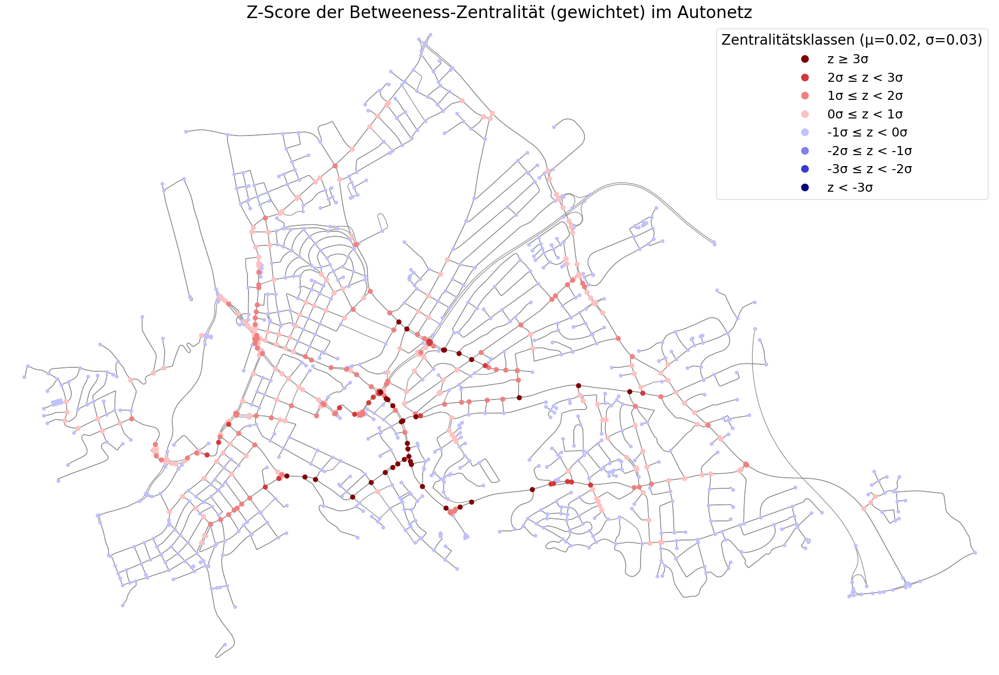

In [15]:
import matplotlib.colors as mcolors
from matplotlib.lines import Line2D

G = ox.graph_from_place("Hagen Mitte, Germany", network_type="drive")
nodes, edges = ox.graph_to_gdfs(G)

# betweenness_weighted = nx.betweenness_centrality(
#     G, 
#     weight='length',  # Attributname der Straßenlängen
#     normalized=True
# )

sorted_betweenness = sorted(betweenness_weighted.items(), key=lambda x: x[1], reverse=True)

# 1. Vorbereitung der Daten
betweenness_values = np.array([x[1] for x in sorted_betweenness])
mean = np.mean(betweenness_values)
std = np.std(betweenness_values)

# 2. Farbpaletten definieren
red_palette = ['#800000', '#D43A3A', '#F08080', '#FFC1C1']  # Rot-Abstufungen
blue_palette = ['#000080', '#3A3AD4', '#8080F0', '#C1C1FF']  # Blau-Abstufungen

# 3. Z-Score Berechnung und Farbzuordnung
nodes['betweenness'] = nodes.index.map(betweenness_weighted.get)
nodes['z_score'] = (nodes['betweenness'] - mean) / std

# Klassengrenzen (in Standardabweichungen)
bins = [-np.inf, -3, -2, -1, 0, 1, 2, 3, np.inf]
color_mapping = {
    0: blue_palette[0],  # < -3σ
    1: blue_palette[1],  # -3σ bis -2σ
    2: blue_palette[2],  # -2σ bis -1σ
    3: blue_palette[3],  # -1σ bis 0σ
    4: red_palette[3],   # 0σ bis 1σ
    5: red_palette[2],   # 1σ bis 2σ
    6: red_palette[1],   # 2σ bis 3σ
    7: red_palette[0]    # > 3σ
}

# Kategorisierung der Knoten
nodes['color_class'] = pd.cut(nodes['z_score'], bins=bins, labels=False)
nodes['color'] = nodes['color_class'].map(color_mapping)

# 4. Visualisierung
fig, ax = ox.plot_graph(G, show=False, close=False, figsize=(20, 20), dpi=300)

fig.patch.set_facecolor('white')  # Hintergrund der gesamten Figur weiß
ax.set_facecolor('white') 

# Kanten plotten
edges.plot(ax=ax, color='gray', linewidth=0.5, alpha=0.5)

# Knoten plotten - WICHTIG: Hier verwenden wir die konkreten Farbwerte
for color_class, group in nodes.groupby('color_class'):
    group.plot(
        ax=ax, 
        color=color_mapping[color_class],  # Konkrete Farbangabe
        markersize=40 if color_class >= 4 else 20,  # Größere Marker für große Werte
        alpha=1,
        zorder=2
    )

# 5. Legende
legend_elements = [
    Line2D([0], [0], marker='o', color='w', label=f'z ≥ 3σ',
           markerfacecolor=red_palette[0], markersize=12),
    Line2D([0], [0], marker='o', color='w', label='2σ ≤ z < 3σ',
           markerfacecolor=red_palette[1], markersize=12),
    Line2D([0], [0], marker='o', color='w', label='1σ ≤ z < 2σ',
           markerfacecolor=red_palette[2], markersize=12),
    Line2D([0], [0], marker='o', color='w', label='0σ ≤ z < 1σ',
           markerfacecolor=red_palette[3], markersize=12),
    Line2D([0], [0], marker='o', color='w', label='-1σ ≤ z < 0σ',
           markerfacecolor=blue_palette[3], markersize=12),
    Line2D([0], [0], marker='o', color='w', label='-2σ ≤ z < -1σ',
           markerfacecolor=blue_palette[2], markersize=12),
    Line2D([0], [0], marker='o', color='w', label='-3σ ≤ z < -2σ',
           markerfacecolor=blue_palette[1], markersize=12),
    Line2D([0], [0], marker='o', color='w', label='z < -3σ',
           markerfacecolor=blue_palette[0], markersize=12)
]

ax.legend(
    handles=legend_elements,
    title=f"Zentralitätsklassen (μ={mean:.2f}, σ={std:.2f})",
    loc='upper right',
    fontsize=18,
    title_fontsize=20
)

plt.title('Z-Score der Betweeness-Zentralität (gewichtet) im Autonetz', fontsize=24)
plt.tight_layout()
plt.savefig('Masterarbeit/autonetz_betweenness_weighted_classes.png', 
           dpi=300, bbox_inches='tight')
plt.show()


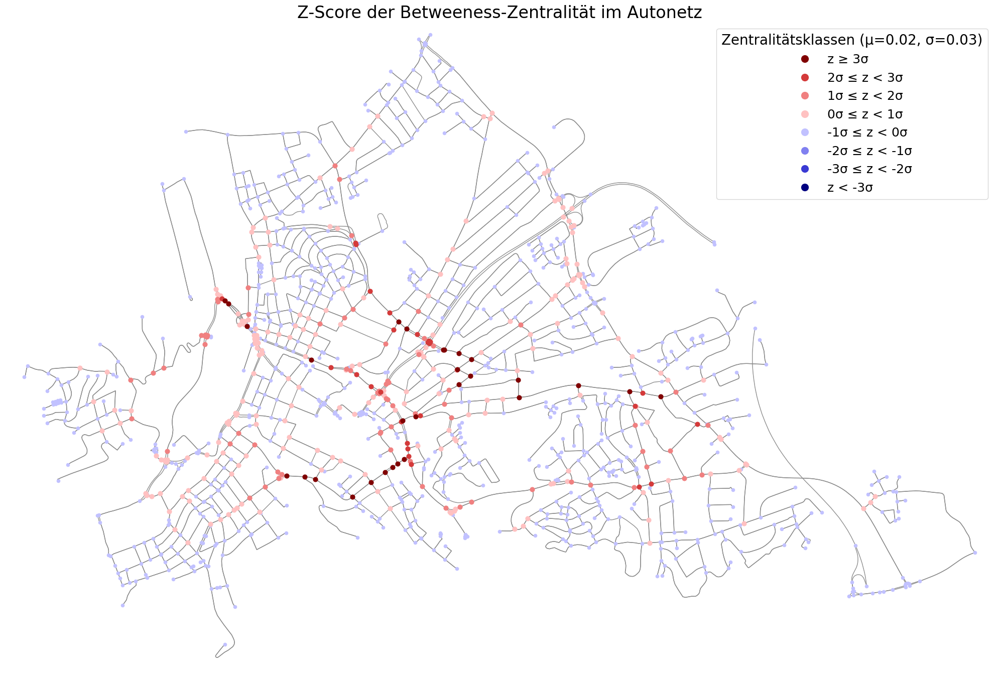

In [16]:
import matplotlib.colors as mcolors
from matplotlib.lines import Line2D

G = ox.graph_from_place("Hagen Mitte, Germany", network_type="drive")
nodes, edges = ox.graph_to_gdfs(G)

betweenness = nx.betweenness_centrality(G, normalized=True)

sorted_betweenness = sorted(betweenness.items(), key=lambda x: x[1], reverse=True)

# 1. Vorbereitung der Daten
betweenness_values = np.array([x[1] for x in sorted_betweenness])
mean = np.mean(betweenness_values)
std = np.std(betweenness_values)

# 2. Farbpaletten definieren
red_palette = ['#800000', '#D43A3A', '#F08080', '#FFC1C1']  # Rot-Abstufungen
blue_palette = ['#000080', '#3A3AD4', '#8080F0', '#C1C1FF']  # Blau-Abstufungen

# 3. Z-Score Berechnung und Farbzuordnung
nodes['betweenness'] = nodes.index.map(betweenness.get)
nodes['z_score'] = (nodes['betweenness'] - mean) / std

# Klassengrenzen (in Standardabweichungen)
bins = [-np.inf, -3, -2, -1, 0, 1, 2, 3, np.inf]
color_mapping = {
    0: blue_palette[0],  # < -3σ
    1: blue_palette[1],  # -3σ bis -2σ
    2: blue_palette[2],  # -2σ bis -1σ
    3: blue_palette[3],  # -1σ bis 0σ
    4: red_palette[3],   # 0σ bis 1σ
    5: red_palette[2],   # 1σ bis 2σ
    6: red_palette[1],   # 2σ bis 3σ
    7: red_palette[0]    # > 3σ
}

# Kategorisierung der Knoten
nodes['color_class'] = pd.cut(nodes['z_score'], bins=bins, labels=False)
nodes['color'] = nodes['color_class'].map(color_mapping)

# 4. Visualisierung
fig, ax = ox.plot_graph(G, show=False, close=False, figsize=(20, 20), dpi=300)

fig.patch.set_facecolor('white')  # Hintergrund der gesamten Figur weiß
ax.set_facecolor('white') 

# Kanten plotten
edges.plot(ax=ax, color='gray', linewidth=0.5, alpha=0.5)

# Knoten plotten - WICHTIG: Hier verwenden wir die konkreten Farbwerte
for color_class, group in nodes.groupby('color_class'):
    group.plot(
        ax=ax, 
        color=color_mapping[color_class],  # Konkrete Farbangabe
        markersize=40 if color_class >= 4 else 20,  # Größere Marker für große Werte
        alpha=1,
        zorder=2
    )

# 5. Legende
legend_elements = [
    Line2D([0], [0], marker='o', color='w', label=f'z ≥ 3σ',
           markerfacecolor=red_palette[0], markersize=12),
    Line2D([0], [0], marker='o', color='w', label='2σ ≤ z < 3σ',
           markerfacecolor=red_palette[1], markersize=12),
    Line2D([0], [0], marker='o', color='w', label='1σ ≤ z < 2σ',
           markerfacecolor=red_palette[2], markersize=12),
    Line2D([0], [0], marker='o', color='w', label='0σ ≤ z < 1σ',
           markerfacecolor=red_palette[3], markersize=12),
    Line2D([0], [0], marker='o', color='w', label='-1σ ≤ z < 0σ',
           markerfacecolor=blue_palette[3], markersize=12),
    Line2D([0], [0], marker='o', color='w', label='-2σ ≤ z < -1σ',
           markerfacecolor=blue_palette[2], markersize=12),
    Line2D([0], [0], marker='o', color='w', label='-3σ ≤ z < -2σ',
           markerfacecolor=blue_palette[1], markersize=12),
    Line2D([0], [0], marker='o', color='w', label='z < -3σ',
           markerfacecolor=blue_palette[0], markersize=12)
]

ax.legend(
    handles=legend_elements,
    title=f"Zentralitätsklassen (μ={mean:.2f}, σ={std:.2f})",
    loc='upper right',
    fontsize=18,
    title_fontsize=20
)

plt.title('Z-Score der Betweeness-Zentralität im Autonetz', fontsize=24)
plt.tight_layout()
plt.savefig('Masterarbeit/autonetz_betweenness_classes.png', 
           dpi=300, bbox_inches='tight')
plt.show()


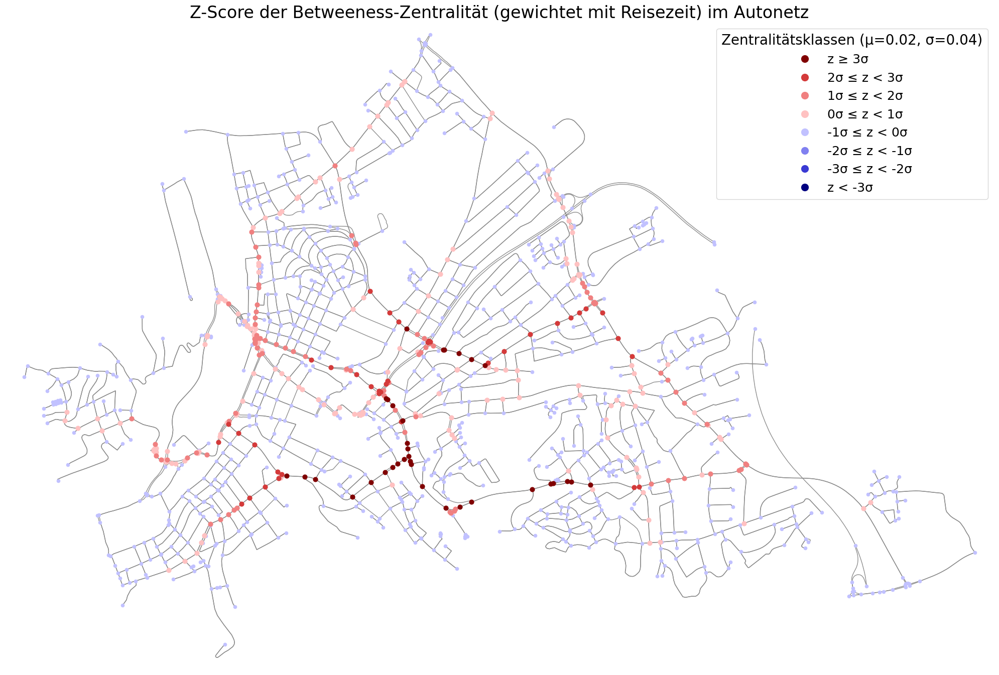

In [17]:
import matplotlib.colors as mcolors
from matplotlib.lines import Line2D

G = ox.graph_from_place("Hagen Mitte, Germany", network_type="drive")
nodes, edges = ox.graph_to_gdfs(G)

# Gewichtete Berechnung mit traveltime
G_car = ox.add_edge_speeds(G)
G_car = ox.add_edge_travel_times(G)

betweenness_weighted_traveltime = nx.betweenness_centrality(G_car, weight='travel_time', normalized=True)

sorted_betweenness = sorted(betweenness_weighted_traveltime.items(), key=lambda x: x[1], reverse=True)

# 1. Vorbereitung der Daten
betweenness_values = np.array([x[1] for x in sorted_betweenness])
mean = np.mean(betweenness_values)
std = np.std(betweenness_values)

# 2. Farbpaletten definieren
red_palette = ['#800000', '#D43A3A', '#F08080', '#FFC1C1']  # Rot-Abstufungen
blue_palette = ['#000080', '#3A3AD4', '#8080F0', '#C1C1FF']  # Blau-Abstufungen

# 3. Z-Score Berechnung und Farbzuordnung
nodes['betweenness'] = nodes.index.map(betweenness_weighted_traveltime.get)
nodes['z_score'] = (nodes['betweenness'] - mean) / std

# Klassengrenzen (in Standardabweichungen)
bins = [-np.inf, -3, -2, -1, 0, 1, 2, 3, np.inf]
color_mapping = {
    0: blue_palette[0],  # < -3σ
    1: blue_palette[1],  # -3σ bis -2σ
    2: blue_palette[2],  # -2σ bis -1σ
    3: blue_palette[3],  # -1σ bis 0σ
    4: red_palette[3],   # 0σ bis 1σ
    5: red_palette[2],   # 1σ bis 2σ
    6: red_palette[1],   # 2σ bis 3σ
    7: red_palette[0]    # > 3σ
}

# Kategorisierung der Knoten
nodes['color_class'] = pd.cut(nodes['z_score'], bins=bins, labels=False)
nodes['color'] = nodes['color_class'].map(color_mapping)

# 4. Visualisierung
fig, ax = ox.plot_graph(G, show=False, close=False, figsize=(20, 20), dpi=300)

fig.patch.set_facecolor('white')  # Hintergrund der gesamten Figur weiß
ax.set_facecolor('white') 

# Kanten plotten
edges.plot(ax=ax, color='gray', linewidth=0.5, alpha=0.5)

# Knoten plotten - WICHTIG: Hier verwenden wir die konkreten Farbwerte
for color_class, group in nodes.groupby('color_class'):
    group.plot(
        ax=ax, 
        color=color_mapping[color_class],  # Konkrete Farbangabe
        markersize=40 if color_class >= 4 else 20,  # Größere Marker für große Werte
        alpha=1,
        zorder=2
    )

# 5. Legende
legend_elements = [
    Line2D([0], [0], marker='o', color='w', label=f'z ≥ 3σ',
           markerfacecolor=red_palette[0], markersize=12),
    Line2D([0], [0], marker='o', color='w', label='2σ ≤ z < 3σ',
           markerfacecolor=red_palette[1], markersize=12),
    Line2D([0], [0], marker='o', color='w', label='1σ ≤ z < 2σ',
           markerfacecolor=red_palette[2], markersize=12),
    Line2D([0], [0], marker='o', color='w', label='0σ ≤ z < 1σ',
           markerfacecolor=red_palette[3], markersize=12),
    Line2D([0], [0], marker='o', color='w', label='-1σ ≤ z < 0σ',
           markerfacecolor=blue_palette[3], markersize=12),
    Line2D([0], [0], marker='o', color='w', label='-2σ ≤ z < -1σ',
           markerfacecolor=blue_palette[2], markersize=12),
    Line2D([0], [0], marker='o', color='w', label='-3σ ≤ z < -2σ',
           markerfacecolor=blue_palette[1], markersize=12),
    Line2D([0], [0], marker='o', color='w', label='z < -3σ',
           markerfacecolor=blue_palette[0], markersize=12)
]

ax.legend(
    handles=legend_elements,
    title=f"Zentralitätsklassen (μ={mean:.2f}, σ={std:.2f})",
    loc='upper right',
    fontsize=18,
    title_fontsize=20
)

plt.title('Z-Score der Betweeness-Zentralität (gewichtet mit Reisezeit) im Autonetz', fontsize=24)
plt.tight_layout()
plt.savefig('Masterarbeit/autonetz_betweenness_weighted_traveltime_classes.png', 
           dpi=300, bbox_inches='tight')
plt.show()


#### Bike

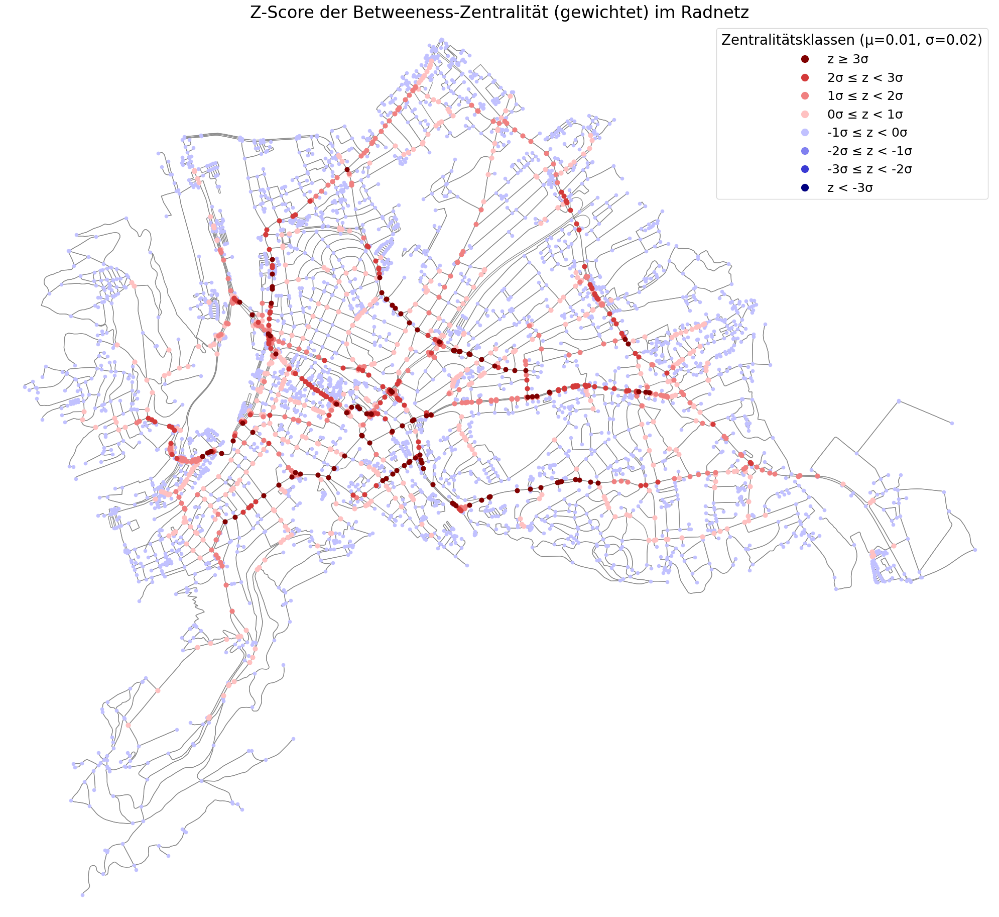

In [19]:
import matplotlib.colors as mcolors
from matplotlib.lines import Line2D

B = ox.graph_from_place("Hagen Mitte, Germany", network_type="bike")
nodes, edges = ox.graph_to_gdfs(B)

# betweenness_bike_weighted = nx.betweenness_centrality(
#     B, 
#     weight='length',  # Attributname der Straßenlängen
#     normalized=True
# )

sorted_betweenness = sorted(betweenness_bike_weighted.items(), key=lambda x: x[1], reverse=True)

# 1. Vorbereitung der Daten
betweenness_values = np.array([x[1] for x in sorted_betweenness])
mean = np.mean(betweenness_values)
std = np.std(betweenness_values)

# 2. Farbpaletten definieren
red_palette = ['#800000', '#D43A3A', '#F08080', '#FFC1C1']  # Rot-Abstufungen
blue_palette = ['#000080', '#3A3AD4', '#8080F0', '#C1C1FF']  # Blau-Abstufungen

# 3. Z-Score Berechnung und Farbzuordnung
nodes['betweenness'] = nodes.index.map(betweenness_bike_weighted.get)
nodes['z_score'] = (nodes['betweenness'] - mean) / std

# Klassengrenzen (in Standardabweichungen)
bins = [-np.inf, -3, -2, -1, 0, 1, 2, 3, np.inf]
color_mapping = {
    0: blue_palette[0],  # < -3σ
    1: blue_palette[1],  # -3σ bis -2σ
    2: blue_palette[2],  # -2σ bis -1σ
    3: blue_palette[3],  # -1σ bis 0σ
    4: red_palette[3],   # 0σ bis 1σ
    5: red_palette[2],   # 1σ bis 2σ
    6: red_palette[1],   # 2σ bis 3σ
    7: red_palette[0]    # > 3σ
}

# Kategorisierung der Knoten
nodes['color_class'] = pd.cut(nodes['z_score'], bins=bins, labels=False)
nodes['color'] = nodes['color_class'].map(color_mapping)

# 4. Visualisierung
fig, ax = ox.plot_graph(B, show=False, close=False, figsize=(20, 20), dpi=300)

fig.patch.set_facecolor('white')  # Hintergrund der gesamten Figur weiß
ax.set_facecolor('white') 

# Kanten plotten
edges.plot(ax=ax, color='gray', linewidth=0.5, alpha=0.5)

# Knoten plotten - WICHTIG: Hier verwenden wir die konkreten Farbwerte
for color_class, group in nodes.groupby('color_class'):
    group.plot(
        ax=ax, 
        color=color_mapping[color_class],  # Konkrete Farbangabe
        markersize=40 if color_class >= 4 else 20,  # Größere Marker für große Werte
        alpha=1,
        zorder=2
    )

# 5. Legende
legend_elements = [
    Line2D([0], [0], marker='o', color='w', label=f'z ≥ 3σ',
           markerfacecolor=red_palette[0], markersize=12),
    Line2D([0], [0], marker='o', color='w', label='2σ ≤ z < 3σ',
           markerfacecolor=red_palette[1], markersize=12),
    Line2D([0], [0], marker='o', color='w', label='1σ ≤ z < 2σ',
           markerfacecolor=red_palette[2], markersize=12),
    Line2D([0], [0], marker='o', color='w', label='0σ ≤ z < 1σ',
           markerfacecolor=red_palette[3], markersize=12),
    Line2D([0], [0], marker='o', color='w', label='-1σ ≤ z < 0σ',
           markerfacecolor=blue_palette[3], markersize=12),
    Line2D([0], [0], marker='o', color='w', label='-2σ ≤ z < -1σ',
           markerfacecolor=blue_palette[2], markersize=12),
    Line2D([0], [0], marker='o', color='w', label='-3σ ≤ z < -2σ',
           markerfacecolor=blue_palette[1], markersize=12),
    Line2D([0], [0], marker='o', color='w', label='z < -3σ',
           markerfacecolor=blue_palette[0], markersize=12)
]

ax.legend(
    handles=legend_elements,
    title=f"Zentralitätsklassen (μ={mean:.2f}, σ={std:.2f})",
    loc='upper right',
    fontsize=18,
    title_fontsize=20
)
plt.title('Z-Score der Betweeness-Zentralität (gewichtet) im Radnetz', fontsize=24)
plt.tight_layout()
plt.savefig('Masterarbeit/radnetz_betweenness_weighted_classes.png', 
           dpi=300, bbox_inches='tight')
plt.show()


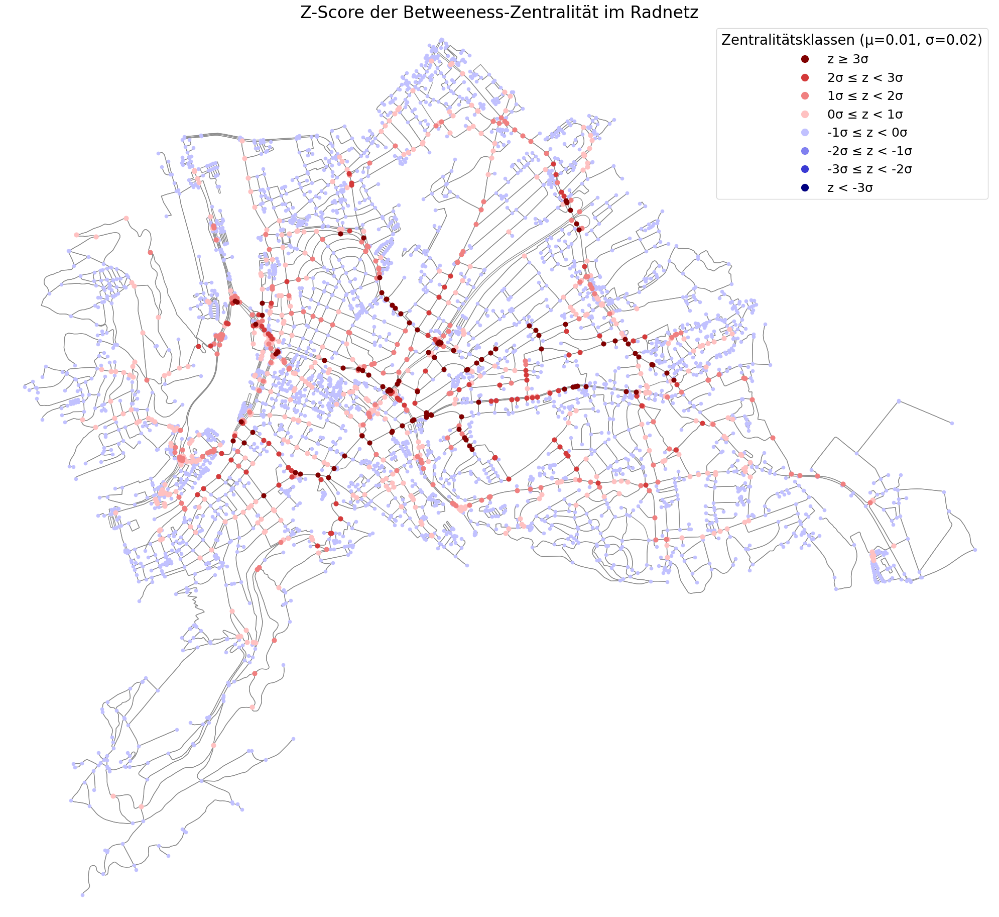

In [20]:
import matplotlib.colors as mcolors
from matplotlib.lines import Line2D

B = ox.graph_from_place("Hagen Mitte, Germany", network_type="bike")
nodes, edges = ox.graph_to_gdfs(B)

# betweenness_bike = nx.betweenness_centrality(B, normalized=True)

sorted_betweenness = sorted(betweenness_bike.items(), key=lambda x: x[1], reverse=True)

# 1. Vorbereitung der Daten
betweenness_values = np.array([x[1] for x in sorted_betweenness])
mean = np.mean(betweenness_values)
std = np.std(betweenness_values)

# 2. Farbpaletten definieren
red_palette = ['#800000', '#D43A3A', '#F08080', '#FFC1C1']  # Rot-Abstufungen
blue_palette = ['#000080', '#3A3AD4', '#8080F0', '#C1C1FF']  # Blau-Abstufungen

# 3. Z-Score Berechnung und Farbzuordnung
nodes['betweenness'] = nodes.index.map(betweenness_bike.get)
nodes['z_score'] = (nodes['betweenness'] - mean) / std

# Klassengrenzen (in Standardabweichungen)
bins = [-np.inf, -3, -2, -1, 0, 1, 2, 3, np.inf]
color_mapping = {
    0: blue_palette[0],  # < -3σ
    1: blue_palette[1],  # -3σ bis -2σ
    2: blue_palette[2],  # -2σ bis -1σ
    3: blue_palette[3],  # -1σ bis 0σ
    4: red_palette[3],   # 0σ bis 1σ
    5: red_palette[2],   # 1σ bis 2σ
    6: red_palette[1],   # 2σ bis 3σ
    7: red_palette[0]    # > 3σ
}

# Kategorisierung der Knoten
nodes['color_class'] = pd.cut(nodes['z_score'], bins=bins, labels=False)
nodes['color'] = nodes['color_class'].map(color_mapping)

# 4. Visualisierung
fig, ax = ox.plot_graph(B, show=False, close=False, figsize=(20, 20), dpi=300)

fig.patch.set_facecolor('white')  # Hintergrund der gesamten Figur weiß
ax.set_facecolor('white') 

# Kanten plotten
edges.plot(ax=ax, color='gray', linewidth=0.5, alpha=0.5)

# Knoten plotten - WICHTIG: Hier verwenden wir die konkreten Farbwerte
for color_class, group in nodes.groupby('color_class'):
    group.plot(
        ax=ax, 
        color=color_mapping[color_class],  # Konkrete Farbangabe
        markersize=40 if color_class >= 4 else 20,  # Größere Marker für große Werte
        alpha=1,
        zorder=2
    )

# 5. Legende
legend_elements = [
    Line2D([0], [0], marker='o', color='w', label=f'z ≥ 3σ',
           markerfacecolor=red_palette[0], markersize=12),
    Line2D([0], [0], marker='o', color='w', label='2σ ≤ z < 3σ',
           markerfacecolor=red_palette[1], markersize=12),
    Line2D([0], [0], marker='o', color='w', label='1σ ≤ z < 2σ',
           markerfacecolor=red_palette[2], markersize=12),
    Line2D([0], [0], marker='o', color='w', label='0σ ≤ z < 1σ',
           markerfacecolor=red_palette[3], markersize=12),
    Line2D([0], [0], marker='o', color='w', label='-1σ ≤ z < 0σ',
           markerfacecolor=blue_palette[3], markersize=12),
    Line2D([0], [0], marker='o', color='w', label='-2σ ≤ z < -1σ',
           markerfacecolor=blue_palette[2], markersize=12),
    Line2D([0], [0], marker='o', color='w', label='-3σ ≤ z < -2σ',
           markerfacecolor=blue_palette[1], markersize=12),
    Line2D([0], [0], marker='o', color='w', label='z < -3σ',
           markerfacecolor=blue_palette[0], markersize=12)
]

ax.legend(
    handles=legend_elements,
    title=f"Zentralitätsklassen (μ={mean:.2f}, σ={std:.2f})",
    loc='upper right',
    fontsize=18,
    title_fontsize=20
)

plt.title('Z-Score der Betweeness-Zentralität im Radnetz', fontsize=24)
plt.tight_layout()
plt.savefig('Masterarbeit/radnetz_betweenness_classes.png', 
           dpi=300, bbox_inches='tight')
plt.show()


#### Vergleich Bike und Drive 

Lade Netzwerke...
Berechne Betweenness-Zentralität für Radnetz...
Berechne Betweenness-Zentralität für Straßennetz...


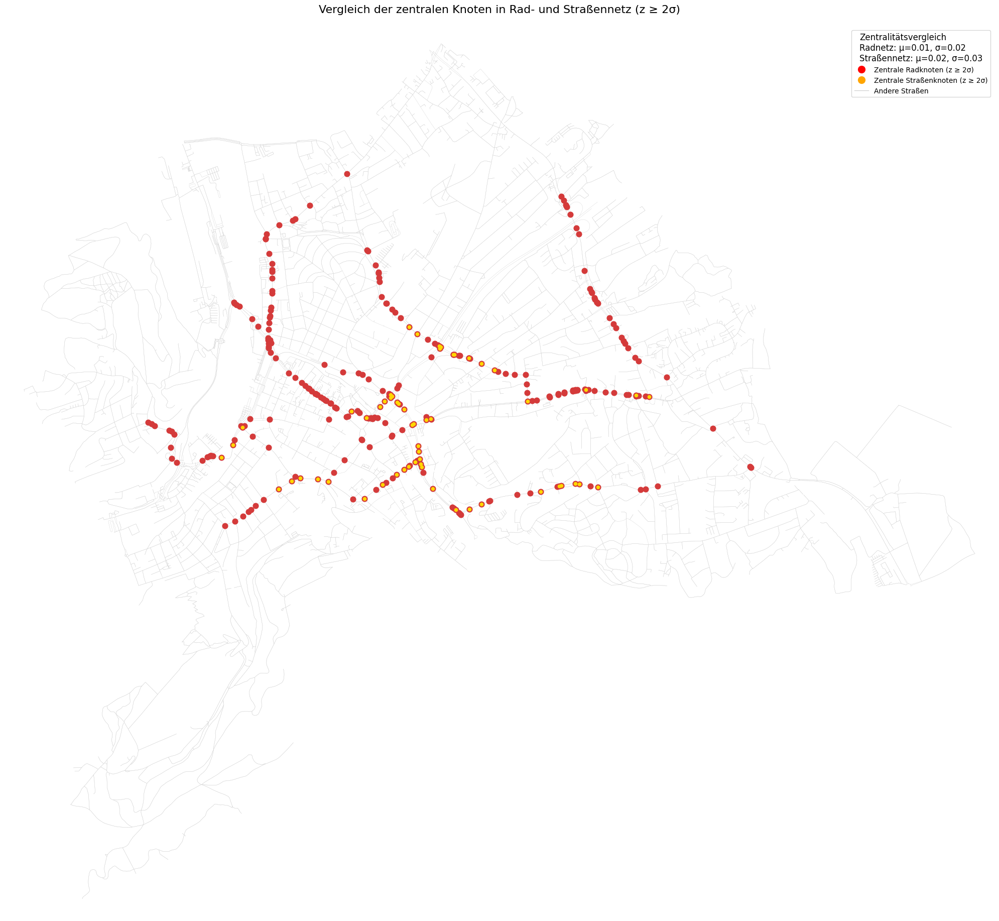

In [37]:
# 1. Beide Netzwerke laden
print("Lade Netzwerke...")
B = ox.graph_from_place("Hagen Mitte, Germany", network_type="bike")
G = ox.graph_from_place("Hagen Mitte, Germany", network_type="drive")

# 2. Betweenness für beide Netzwerke einlesen
print("Berechne Betweenness-Zentralität für Radnetz...")
df_betweenness = pd.read_csv('Masterarbeit/betweenness_bike_results.csv', index_col='node')
betweenness_bike = df_betweenness['betweenness_weighted'].to_dict()

print("Berechne Betweenness-Zentralität für Straßennetz...")
df_betweenness_drive = pd.read_csv('Masterarbeit/betweenness_drive_results.csv', index_col='node')
betweenness_drive = df_betweenness_drive['betweenness_weighted'].to_dict()


# 3. Daten vorbereiten
bike_nodes = ox.graph_to_gdfs(B, edges=False)
drive_nodes = ox.graph_to_gdfs(G, edges=False)

# Z-Scores für Radnetz berechnen
bike_values = np.array(list(betweenness_bike_weighted.values()))
bike_mean = np.mean(bike_values)
bike_std = np.std(bike_values)
bike_nodes['z_score'] = (bike_nodes.index.map(betweenness_bike.get) - bike_mean) / bike_std

# Z-Scores für Straßennetz berechnen
drive_values = np.array(list(betweenness_drive.values()))
drive_mean = np.mean(drive_values)
drive_std = np.std(drive_values)
drive_nodes['z_score'] = (drive_nodes.index.map(betweenness_drive.get) - drive_mean) / drive_std

# 4. Visualisierung vorbereiten
fig, ax = ox.plot_graph(B, 
                       show=False, 
                       close=False,
                       figsize=(20, 20),
                       dpi=300,
                       bgcolor='white',
                       node_size=0,  # Knoten zunächst ausblenden
                       edge_color='lightgray',
                       edge_linewidth=0.3)

# 5. Straßennetz-Knoten plotten (nur z ≥ 2σ in Orange)
drive_nodes['is_central'] = drive_nodes['z_score'] >= 2
central_drive_nodes = drive_nodes[drive_nodes['is_central']]
central_drive_nodes.plot(ax=ax, 
                        color='#FFD700',
                        markersize=20,
                        alpha=1,
                        zorder=3,
                        label='Zentrale Straßenknoten (z ≥ 2σ)')

# 6. Radnetz-Knoten plotten (nur z ≥ 2σ in Rot)
bike_nodes['is_central'] = bike_nodes['z_score'] >= 2
central_bike_nodes = bike_nodes[bike_nodes['is_central']]
central_bike_nodes.plot(ax=ax, 
                       color='#D43A3A',
                       markersize=60,
                       alpha=1,
                       zorder=2,
                       label='Zentrale Radknoten (z ≥ 2σ)')

# 7. Legende
legend_elements = [
    Line2D([0], [0], marker='o', color='w', label='Zentrale Radknoten (z ≥ 2σ)',
           markerfacecolor='#FF0000', markersize=12),
    Line2D([0], [0], marker='o', color='w', label='Zentrale Straßenknoten (z ≥ 2σ)',
           markerfacecolor='#FFA500', markersize=12),
    Line2D([0], [0], color='lightgray', lw=1, label='Andere Straßen')
]

ax.legend(handles=legend_elements,
         loc='upper right',
         title=f"Zentralitätsvergleich\nRadnetz: μ={bike_mean:.2f}, σ={bike_std:.2f}\nStraßennetz: μ={drive_mean:.2f}, σ={drive_std:.2f}",
         fontsize=10,
         title_fontsize=12)

# 8. Titel und Speichern
ax.set_title("Vergleich der zentralen Knoten in Rad- und Straßennetz (z ≥ 2σ)", 
            fontsize=16, pad=20)
plt.tight_layout()
plt.savefig('Masterarbeit/combined_bike_drive_centrality.png', 
           dpi=300, bbox_inches='tight')
plt.show()


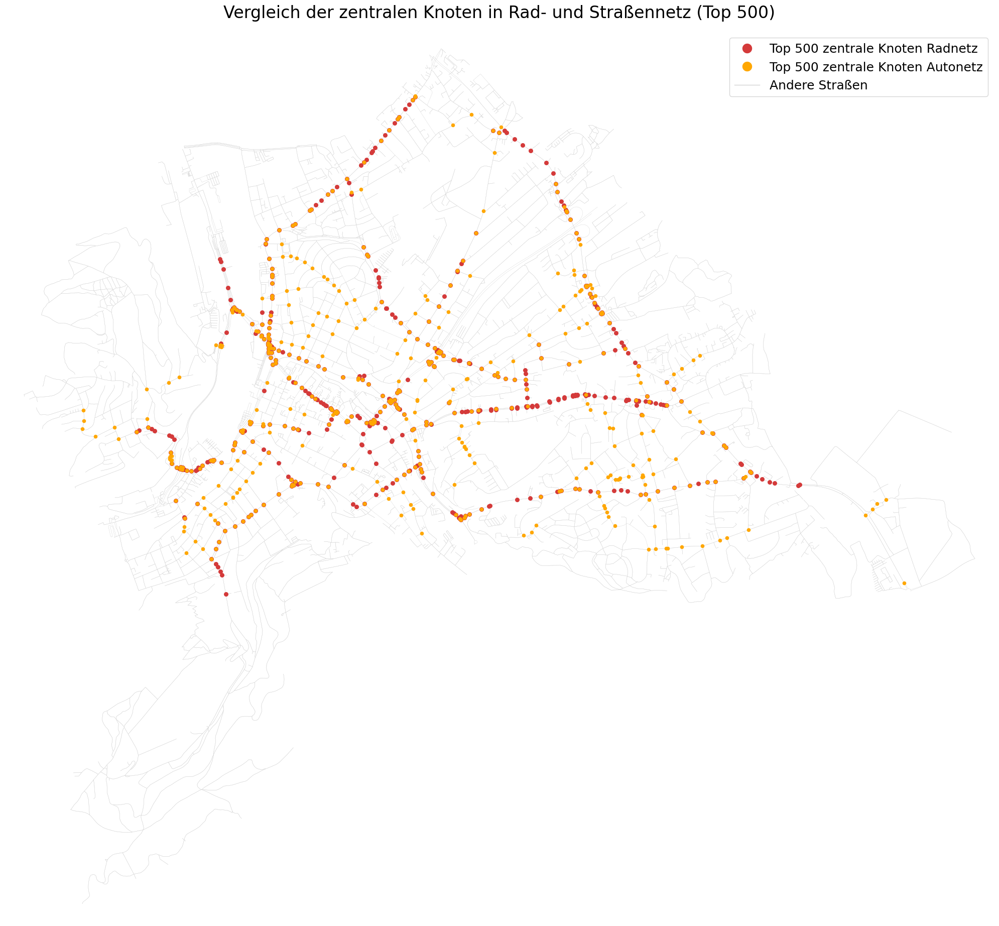

In [34]:
# 1. Beide Netzwerke laden
B = ox.graph_from_place("Hagen Mitte, Germany", network_type="bike")
G = ox.graph_from_place("Hagen Mitte, Germany", network_type="drive")

# 2. Knotenzentralität berechnen (Betweenness Centrality)
betweenness_bike = nx.betweenness_centrality(B, weight='length', normalized=True)
betweenness_drive = nx.betweenness_centrality(G, weight='length', normalized=True)

# 3. Sortiere die Knoten nach Zentralität
sorted_bike_nodes = sorted(betweenness_weighted.items(), key=lambda x: x[1], reverse=True)
sorted_drive_nodes = sorted(betweenness_weighted.items(), key=lambda x: x[1], reverse=True)

top_n = 500

# 4. Top-N Knoten extrahieren
top_bike_node_ids = [node[0] for node in sorted_bike_nodes[:top_n]]
top_drive_node_ids = [node[0] for node in sorted_drive_nodes[:top_n]]

# 5. GeoDataFrames für die Knoten erstellen
bike_nodes = ox.graph_to_gdfs(B, edges=False)
drive_nodes = ox.graph_to_gdfs(G, edges=False)

top_bike_nodes_gdf = bike_nodes.loc[top_bike_node_ids]
top_drive_nodes_gdf = drive_nodes.loc[top_drive_node_ids]

# 6. Visualisierung vorbereiten
fig, ax = ox.plot_graph(B, 
                       show=False, 
                       close=False,
                       figsize=(20, 20),
                       dpi=300,
                       bgcolor='white',
                       node_size=0,
                       edge_color='lightgray',
                       edge_linewidth=0.3)

# 7. Top-Knoten plotten
top_bike_nodes_gdf.plot(ax=ax, color='#D43A3A', markersize=30, alpha=1, zorder=3, label='Top 500 Knoten Radnetz')
top_drive_nodes_gdf.plot(ax=ax, color='#FFA700', markersize=20, alpha=1, zorder=4, label='Top 500 Knoten Autonetz')

# 8. Legende und Titel
legend_elements = [
    Line2D([0], [0], marker='o', color='w', markerfacecolor='#D43A3A', markersize=15, label='Top 500 zentrale Knoten Radnetz'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='#FFA700', markersize=15, label='Top 500 zentrale Knoten Autonetz'),
    Line2D([0], [0], color='lightgray', lw=1, label='Straßen')
]

ax.legend(handles=legend_elements,
         loc='upper right',
         fontsize=18,
         title_fontsize=20)

ax.set_title("Vergleich der zentralen Knoten in Autonetz und Radnetz(Top 500)", 
            fontsize=24, pad=20)
plt.tight_layout()
plt.savefig('Masterarbeit/combined_node_centrality_500.png', dpi=300, bbox_inches='tight')
plt.show()


### Edge-Betweeness

#### Bike

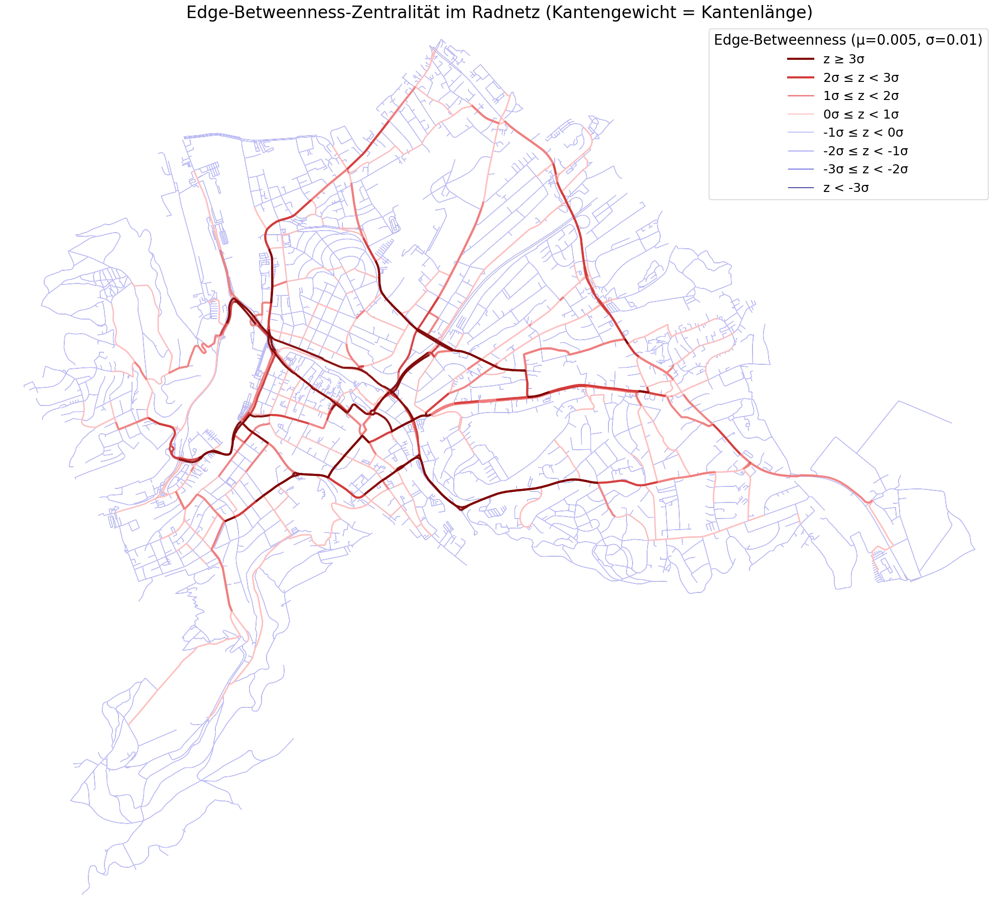

In [36]:

# Graph laden und Betweenness berechnen
B = ox.graph_from_place("Hagen Mitte, Germany", network_type="bike")
nodes, edges = ox.graph_to_gdfs(B)

# 1. Datenvorbereitung
edges['betweenness'] = edges.index.map(edge_betweenness_bike_weighted.get)
betweenness_values = edges['betweenness'].dropna().values

mean = np.mean(betweenness_values)
std = np.std(betweenness_values)

# 2. Farbpaletten (identisch zur Node-Version)
red_palette = ['#800000', '#D43A3A', '#F08080', '#FFC1C1']  # Rot-Abstufungen (hohe Zentralität)
blue_palette = ['#000080', '#3A3AD4', '#8080F0', '#C1C1FF']  # Blau-Abstufungen (niedrige Zentralität)

# 3. Z-Score Berechnung und Klassifizierung
edges['z_score'] = (edges['betweenness'] - mean) / std
bins = [-np.inf, -3, -2, -1, 0, 1, 2, 3, np.inf]
color_mapping = {
    0: blue_palette[0],  # < -3σ
    1: blue_palette[1],  # -3σ bis -2σ
    2: blue_palette[2],  # -2σ bis -1σ
    3: blue_palette[3],  # -1σ bis 0σ
    4: red_palette[3],   # 0σ bis 1σ
    5: red_palette[2],   # 1σ bis 2σ
    6: red_palette[1],   # 2σ bis 3σ
    7: red_palette[0]    # > 3σ
}
edges['color_class'] = pd.cut(edges['z_score'], bins=bins, labels=False)
edges['color'] = edges['color_class'].map(color_mapping)

# 4. Visualisierung
fig, ax = ox.plot_graph(
    B, 
    show=False, 
    close=False,
    figsize=(20, 20),
    dpi=300,
    node_size=0,  # Knoten ausblenden
    edge_color='black',  # Hintergrund für nicht klassifizierte Kanten
    edge_linewidth=0.5,
    bgcolor='white'
)
            
for color_class, group in edges.groupby('color_class'):
    group.plot(
        ax=ax,
        color=color_mapping[color_class],
        linewidth=3 if color_class >= 5 else (2 if color_class >= 4 else 1),
        alpha=0.9,
        zorder=2
    )

# 5. Legende
legend_elements = [
    Line2D([0], [0], color=red_palette[0], lw=3, label='z ≥ 3σ'),
    Line2D([0], [0], color=red_palette[1], lw=3, label='2σ ≤ z < 3σ'),
    Line2D([0], [0], color=red_palette[2], lw=2, label='1σ ≤ z < 2σ'),
    Line2D([0], [0], color=red_palette[3], lw=1.5, label='0σ ≤ z < 1σ'),
    Line2D([0], [0], color=blue_palette[3], lw=1.5, label='-1σ ≤ z < 0σ'),
    Line2D([0], [0], color=blue_palette[2], lw=1, label='-2σ ≤ z < -1σ'),
    Line2D([0], [0], color=blue_palette[1], lw=1, label='-3σ ≤ z < -2σ'),
    Line2D([0], [0], color=blue_palette[0], lw=1, label='z < -3σ')
]

ax.legend(
    handles=legend_elements,
    title=f"Edge-Betweenness (μ={mean:.3f}, σ={std:.2f})",
    loc='upper right',
    fontsize=18,
    title_fontsize=20,
    framealpha=1
)

plt.title("Edge-Betweenness-Zentralität im Radnetz (Kantengewicht = Kantenlänge)", fontsize=24)
plt.tight_layout()
plt.savefig('Masterarbeit/edge_betweenness_weighted_bike.png', dpi=300, bbox_inches='tight')
plt.show()


In [32]:
# Anzahl der Kanten pro Bin berechnen
edge_counts = edges['color_class'].value_counts().sort_index()

# Optional: Als Dictionary ausgeben (für weitere Analysen)
print(edge_counts.to_dict())

{3: 7729, 4: 1181, 5: 444, 6: 294, 7: 310}


#### Vergleich Edge_betweeness und Betweeness z-score

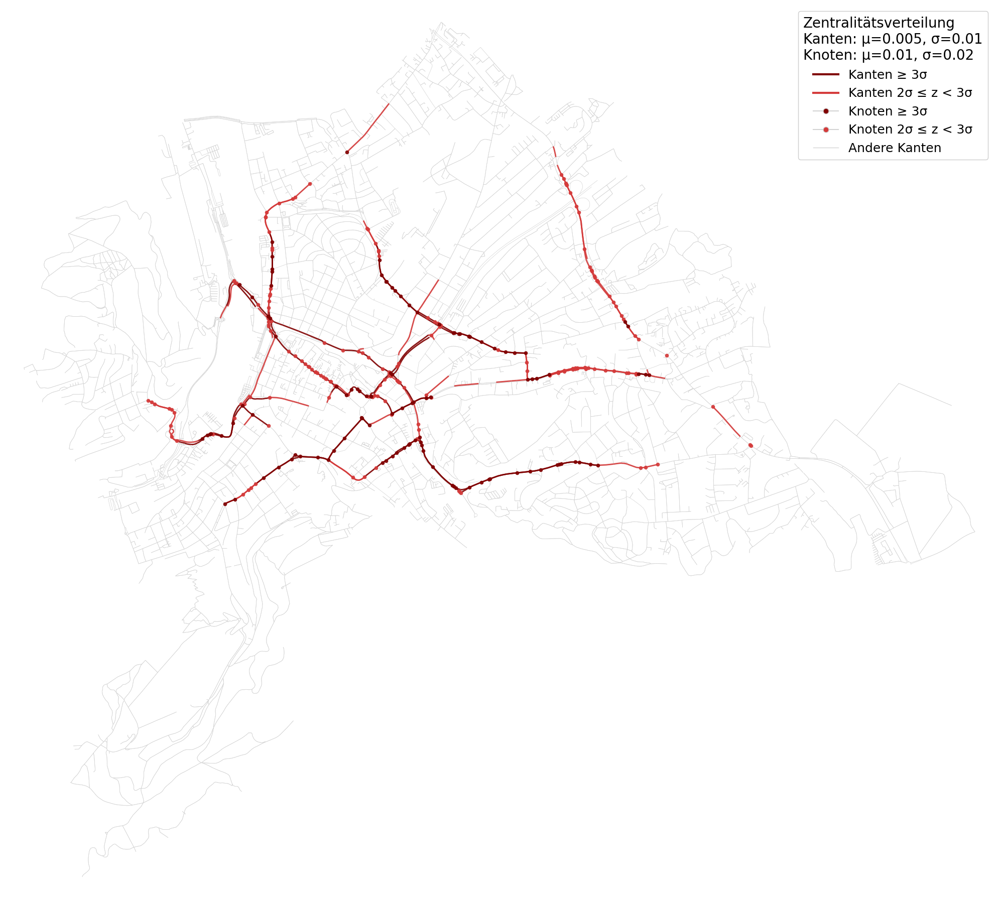

In [50]:
# Graph laden und Betweenness berechnen
B = ox.graph_from_place("Hagen Mitte, Germany", network_type="bike")
nodes, edges = ox.graph_to_gdfs(B)

# 1. EDGE BETWEENNESS Vorbereitung (wie in Ihrem Code)
edges['betweenness'] = edges.index.map(edge_betweenness_bike_weighted.get)
edge_betweenness_values = edges['betweenness'].dropna().values
edge_mean = np.mean(edge_betweenness_values)
edge_std = np.std(edge_betweenness_values)

# 2. NODE BETWEENNESS Vorbereitung (wie in Ihrer früheren Analyse)
node_betweenness_values = np.array(list(betweenness_bike_weighted.values()))
node_mean = np.mean(node_betweenness_values)
node_std = np.std(node_betweenness_values)

# 3. Gemeinsame Farbpaletten
red_palette = ['#800000', '#D43A3A', '#F08080', '#FFC1C1']
blue_palette = ['#000080', '#3A3AD4', '#8080F0', '#C1C1FF']

color_mapping = {
    0: blue_palette[0],  # < -3σ
    1: blue_palette[1],  # -3σ bis -2σ
    2: blue_palette[2],  # -2σ bis -1σ
    3: blue_palette[3],  # -1σ bis 0σ
    4: red_palette[3],   # 0σ bis 1σ
    5: red_palette[2],   # 1σ bis 2σ
    6: red_palette[1],   # 2σ bis 3σ
    7: red_palette[0]    # > 3σ
}

# 4. Klassifizierung für KANTEN
edges['z_score'] = (edges['betweenness'] - edge_mean) / edge_std
edge_bins = [-np.inf, -3, -2, -1, 0, 1, 2, 3, np.inf]
edges['color_class'] = pd.cut(edges['z_score'], bins=edge_bins, labels=False)

# 5. Klassifizierung für KNOTEN
nodes['betweenness'] = nodes.index.map(betweenness_bike_weighted.get)
nodes['z_score'] = (nodes['betweenness'] - node_mean) / node_std
nodes['color_class'] = pd.cut(nodes['z_score'], bins=edge_bins, labels=False)

# 6. Visualisierung
fig, ax = ox.plot_graph(
    B, 
    show=False, 
    close=False,
    figsize=(20, 20),
    dpi=300,
    node_size=0,  # Knoten zunächst ausblenden
    edge_color='lightgray',
    edge_linewidth=0.5,
    bgcolor='white'
)

# Kanten plotten (nur die zwei höchsten Klassen in Rot)
for color_class, group in edges.groupby('color_class'):
    if color_class >= 6:  # Nur z ≥ 2σ
        group.plot(
            ax=ax,
            color=color_mapping[color_class],
            linewidth=2 if color_class >= 6 else 1,
            alpha=0.9,
            zorder=2
        )

# Knoten plotten (nur die zwei höchsten Klassen in Rot)
for color_class, group in nodes.groupby('color_class'):
    if color_class >= 6:  # Nur z ≥ 2σ
        group.plot(
            ax=ax,
            color=color_mapping[color_class],
            markersize=20,
            alpha=0.9,
            zorder=3
        )

# 7. Kombinierte Legende
legend_elements = [
    Line2D([0], [0], color=red_palette[0], lw=3, label='Kanten ≥ 3σ'),
    Line2D([0], [0], color=red_palette[1], lw=3, label='Kanten 2σ ≤ z < 3σ'),
    Line2D([0], [0], marker='o', color='lightgray', label='Knoten ≥ 3σ',
           markerfacecolor=red_palette[0], markersize=8),
    Line2D([0], [0], marker='o', color='lightgray', label='Knoten 2σ ≤ z < 3σ',
           markerfacecolor=red_palette[1], markersize=8),
    Line2D([0], [0], color='lightgray', lw=1, label='Andere Kanten')
]

ax.legend(
    handles=legend_elements,
    title=f"Zentralitätsverteilung\nKanten: μ={edge_mean:.3f}, σ={edge_std:.2f}\nKnoten: μ={node_mean:.2f}, σ={node_std:.2f}",
    loc='upper right',
    fontsize=18,
    title_fontsize=20,
    framealpha=1
)

plt.tight_layout()
plt.savefig('Masterarbeit/combined_centrality_bike.png', dpi=300, bbox_inches='tight')
plt.show()


#### Stresslevel mit zentralen Kanten

In [5]:
import geopandas as gpd
from shapely.geometry import LineString

import shapely
from shapely.ops import transform
import pyproj

B = ox.graph_from_place("Hagen Mitte, Germany", network_type="bike")

edge_betweenness_bike_weighted = nx.edge_betweenness_centrality(B, weight='length', normalized=True)

top_n = 604
sorted_betweenness_edges = sorted(edge_betweenness_bike_weighted.items(), key=lambda x: x[1], reverse=True)
top_edges = [edge for edge, _ in sorted_betweenness_edges[:top_n]]

# Erzeuge GeoDataFrame der zentralen Kanten aus dem Graph B
def edge_to_linestring(edge, graph):
    u, v = edge[:2]  # Nur die ersten beiden Werte nehmen
    return LineString([
        (graph.nodes[u]['x'], graph.nodes[u]['y']),
        (graph.nodes[v]['x'], graph.nodes[v]['y'])
    ])


edges_gdf = gpd.GeoDataFrame(
    {'geometry': [edge_to_linestring(edge, B) for edge in top_edges]},
    index=top_edges,
    crs=B.graph['crs']
)

# Lade das Radwegenetz als GeoDataFrame
bike_nodes, bike_edges = ox.graph_to_gdfs(Cycleway_combined_filtered)

def is_edge_on_network(edge_geom, bike_edges_gdf, tolerance_meters=20):
    # Projiziere bike_edges_gdf und edge_geom ins UTM-Koordinatensystem (Meter)
    bike_edges_gdf_utm = bike_edges_gdf.to_crs(epsg=25832)
    # edge_geom muss ebenfalls transformiert werden

    # Hole das Transformations-Objekt
    project = pyproj.Transformer.from_crs(bike_edges_gdf.crs, 25832, always_xy=True).transform
    edge_geom_utm = shapely.ops.transform(project, edge_geom)

    # Erzeuge einen Buffer um die Radwegkanten (in Metern)
    buffered_bike_edges = bike_edges_gdf_utm.geometry.buffer(tolerance_meters)
    # Prüfe, ob die zentrale Kante vollständig innerhalb einer gepufferten Radwegkante liegt
    return buffered_bike_edges.apply(lambda bike_edge: edge_geom_utm.within(bike_edge)).any()


coverage_edges = {
    edge: is_edge_on_network(geom, bike_edges)
    for edge, geom in edges_gdf.geometry.items()
}

coverage_ratio_edges = sum(coverage_edges.values()) / len(coverage_edges)
print(f"Tatsächliche Abdeckung der Top-Kanten durch das Radwegenetz: {coverage_ratio_edges:.1%}")

covered_edges = [edge for edge, is_covered in coverage_edges.items() if is_covered]
print(f"Anzahl der abgedeckten Kanten: {len(covered_edges)} von {len(coverage_edges)}")


Tatsächliche Abdeckung der Top-Kanten durch das Radwegenetz: 35.8%
Anzahl der abgedeckten Kanten: 216 von 604


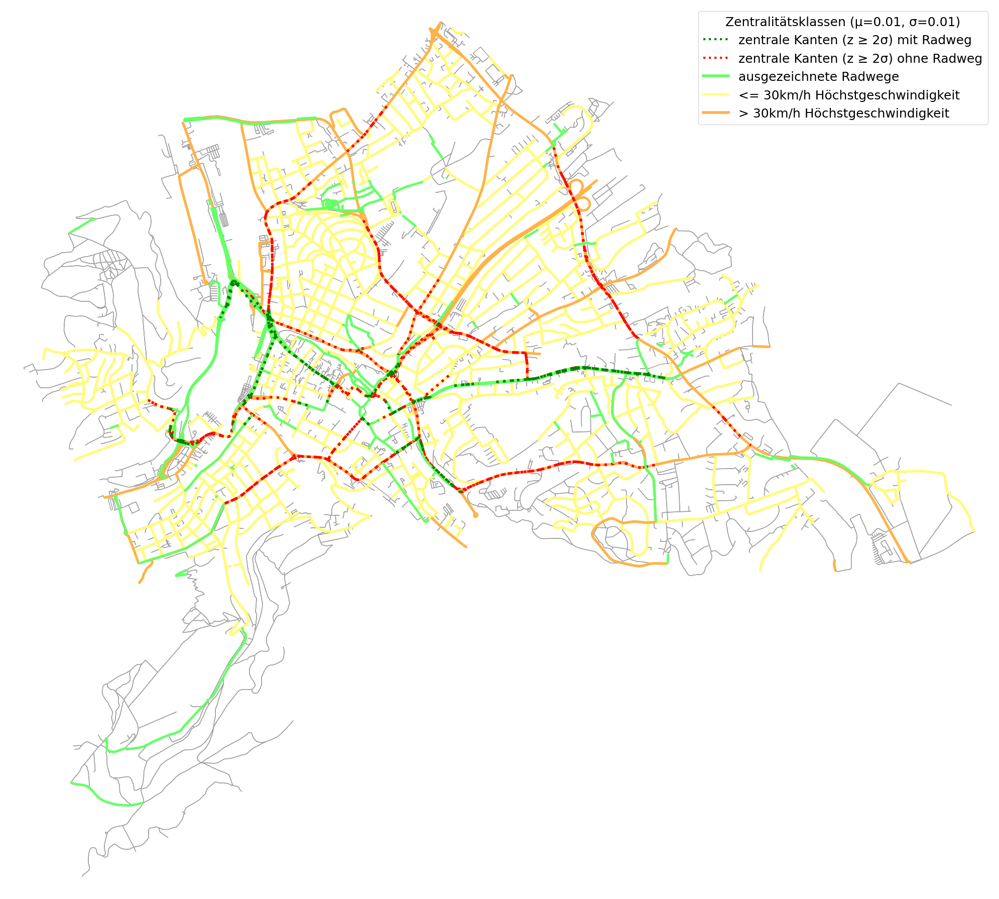

In [17]:
import re

# 3. Datenvorbereitung für Kanten
bike_edges = ox.graph_to_gdfs(B, nodes=False)

# Z-Scores für Radnetz-Kanten berechnen
bike_edge_values = np.array(list(edge_betweenness_bike_weighted.values()))
bike_edge_mean = np.mean(bike_edge_values)
bike_edge_std = np.std(bike_edge_values)
bike_edges['z_score'] = (bike_edges.index.map(edge_betweenness_bike_weighted.get) - bike_edge_mean) / bike_edge_std

# Extrahiere alle Kanten aus Graph B
all_nodes, all_edges = ox.graph_to_gdfs(B)

# Muster für die Filterung
pattern_maxspeed = re.compile(r"^(40|50|60|70|80)$")
pattern_highway = re.compile(r"trunk|trunk_link")

# Filtermaske: maxspeed in (40, 50, 60, 70, 80) ODER highway ist trunk/trunk_link
mask = all_edges["maxspeed"].astype(str).str.match(pattern_maxspeed) | all_edges["highway"].astype(str).str.contains(pattern_highway)

# Gefilterte "schnelle" Kanten
fast_edges_filtered = all_edges[mask]

# Extrahiere IDs der langsamen und Fahrrad-Kanten
slow_nodes, slow_edges = ox.graph_to_gdfs(G_slow)
cycleway_nodes, cycleway_edges = ox.graph_to_gdfs(Cycleway_combined_filtered)
slow_edge_ids = slow_edges.index
cycleway_edge_ids = cycleway_edges.index

# Zeichne das Netz
fig, ax = ox.plot_graph(B, node_color='none', show=False, close=False, figsize=(20,20), dpi=300)
fig.patch.set_facecolor('white')
ax.set_facecolor('white')

# Zeichne die Kanten nach Kategorie
remaining_slow_edges = slow_edges[ ~slow_edges.index.isin(cycleway_edge_ids)]
remaining_slow_edges.plot(ax=ax, color='#FFFB7D', linewidth=3.5, alpha=1, zorder=3)

remaining_fast_edges_filtered = fast_edges_filtered[ ~fast_edges_filtered.index.isin(cycleway_edge_ids)]
remaining_fast_edges_filtered.plot(ax=ax, color='#FFB347', linewidth=3.5, alpha=1, zorder=4)

# Die restlichen Kanten (ohne slow, bike, fast)
remaining_edges = all_edges[
    ~all_edges.index.isin(slow_edge_ids)
    & ~all_edges.index.isin(cycleway_edge_ids)
    & ~all_edges.index.isin(fast_edges_filtered.index)
]
remaining_edges.plot(ax=ax, color='lightgrey', linewidth=0.5, alpha=0.1)

# Radwege-Kanten grün
cycleway_edges.plot(ax=ax, color='#66FF66', linewidth=3.2, alpha=1, zorder=6)

# # Kanten (z ≥ 2σ)
for z_class, group in bike_edges.groupby(pd.cut(bike_edges['z_score'], 
                                              [-np.inf, 2, np.inf])):
    if z_class.right > 2:
        color = 'red'  # Rot
        lw = 3.7
        group.plot(ax=ax, color=color, linewidth=lw, zorder=5, linestyle=':')
        
covered_edges_gdf = edges_gdf.loc[covered_edges]
covered_edges_gdf.plot(ax=ax, color='green', linewidth=3.7, zorder=7, linestyle=':')
        

# Legende
from matplotlib.lines import Line2D
legend_elements = [
Line2D([0], [0], color='green', lw=3, linestyle=':', label='zentrale Kanten (z ≥ 2σ) mit Radweg'),
Line2D([0], [0], color='red', lw=3, linestyle=':', label='zentrale Kanten (z ≥ 2σ) ohne Radweg'),
Line2D([0], [0], color='#66FF66', lw=4, label='ausgezeichnete Radwege'),       # hellgrün
Line2D([0], [0], color='#FFFB7D', lw=3, label='<= 30km/h Höchstgeschwindigkeit'), # hellgelb
Line2D([0], [0], color='#FFB347', lw=4, label='> 30km/h Höchstgeschwindigkeit')
]
ax.legend(
    handles=legend_elements,
    title=f"Zentralitätsklassen (μ={bike_edge_mean:.2f}, σ={bike_edge_std:.2f})",
    loc='upper right',
    fontsize=18,
    title_fontsize=18
)

# ax.set_title("Radnetz mit Stressleveln und zentralen Kanten", fontsize=24)

plt.tight_layout()
plt.savefig('Masterarbeit/Radnetz_Stresslevel_ZentraleKanten_Abdeckung.png', dpi=300, bbox_inches='tight')
plt.show()


In [18]:
# Beispiel: UTM-Zone 32N für Deutschland, passe ggf. an deine Region an!
edges_gdf_utm = edges_gdf.to_crs(epsg=32632)
covered_edges_gdf_utm = covered_edges_gdf.to_crs(epsg=32632)

# Gesamtlänge der zentralen Kanten
total_length = edges_gdf_utm.length.sum()

# Gesamtlänge der abgedeckten Kanten
covered_length = covered_edges_gdf_utm.length.sum()

# Prozentuale Abdeckung
coverage_percent = covered_length / total_length * 100

print(f"Gesamtlänge zentrale Kanten: {total_length:.1f} m")
print(f"Abgedeckte Länge: {covered_length:.1f} m")
print(f"Abgedeckter Anteil: {coverage_percent:.1f} %")

Gesamtlänge zentrale Kanten: 30889.7 m
Abgedeckte Länge: 8156.7 m
Abgedeckter Anteil: 26.4 %


#### Stresslevel mit zentralen Knoten

In [7]:
import geopandas as gpd
from shapely.geometry import Point

B = ox.graph_from_place("Hagen Mitte, Germany", network_type="bike")

betweenness_bike_weighted = nx.betweenness_centrality(
    B, 
    weight='length',  # Attributname der Straßenlängen
    normalized=True
)

def is_point_on_network(point, nodes_gdf, edges_gdf, tolerance_m=20):
    buffered_point = point.buffer(tolerance_m)
    if nodes_gdf.distance(point).min() < tolerance_m:
        return True
    return edges_gdf.intersects(buffered_point).any()

# Sortieren der Knoten nach Betweenness-Zentralität
sorted_betweenness = sorted(betweenness_bike_weighted.items(), key=lambda x: x[1], reverse=True)

# Top 100 Knoten auswählen
top_n = 278
top_nodes = sorted_betweenness[:top_n]

# Extrahieren der Koordinaten der Top Knoten des Autonetzes
nodes_gdf = gpd.GeoDataFrame.from_dict(
    {node[0]: Point(B.nodes[node[0]]['x'], B.nodes[node[0]]['y']) for node in top_nodes},
    orient='index', columns=['geometry']
)
nodes_gdf.crs = B.graph['crs']

# Projektionseinstellungen
target_crs = "EPSG:25832"  # Anpassen an Ihre Region

# Projektion der Knoten
nodes_gdf = nodes_gdf.to_crs(target_crs)

# Projektion des Radnetzes
bike_nodes, bike_edges = ox.graph_to_gdfs(Cycleway_combined_filtered)
bike_nodes = bike_nodes.to_crs(target_crs)
bike_edges = bike_edges.to_crs(target_crs)

# Überprüfung mit metrischer Toleranz
coverage = {osm_id: is_point_on_network(point, bike_nodes, bike_edges, 20) 
            for osm_id, point in nodes_gdf.geometry.items()}

coverage_ratio = sum(coverage.values()) / len(coverage)
print(f"Tatsächliche Abdeckung der Top-Knoten durch das Radwegenetz: {coverage_ratio:.1%}")

# Ausgabe der abgedeckten OSM-IDs
covered_osm_ids = [osm_id for osm_id, is_covered in coverage.items() if is_covered]
# print("\nAbgedeckte OSM-IDs:")
# for osm_id in covered_osm_ids:
#     print(f"Knoten {osm_id} ist durch das Radnetz abgedeckt.")

print(f"\nAnzahl der abgedeckten Knoten: {len(covered_osm_ids)} von {len(coverage)}")

Tatsächliche Abdeckung der Top-Knoten durch das Radwegenetz: 44.2%

Anzahl der abgedeckten Knoten: 123 von 278


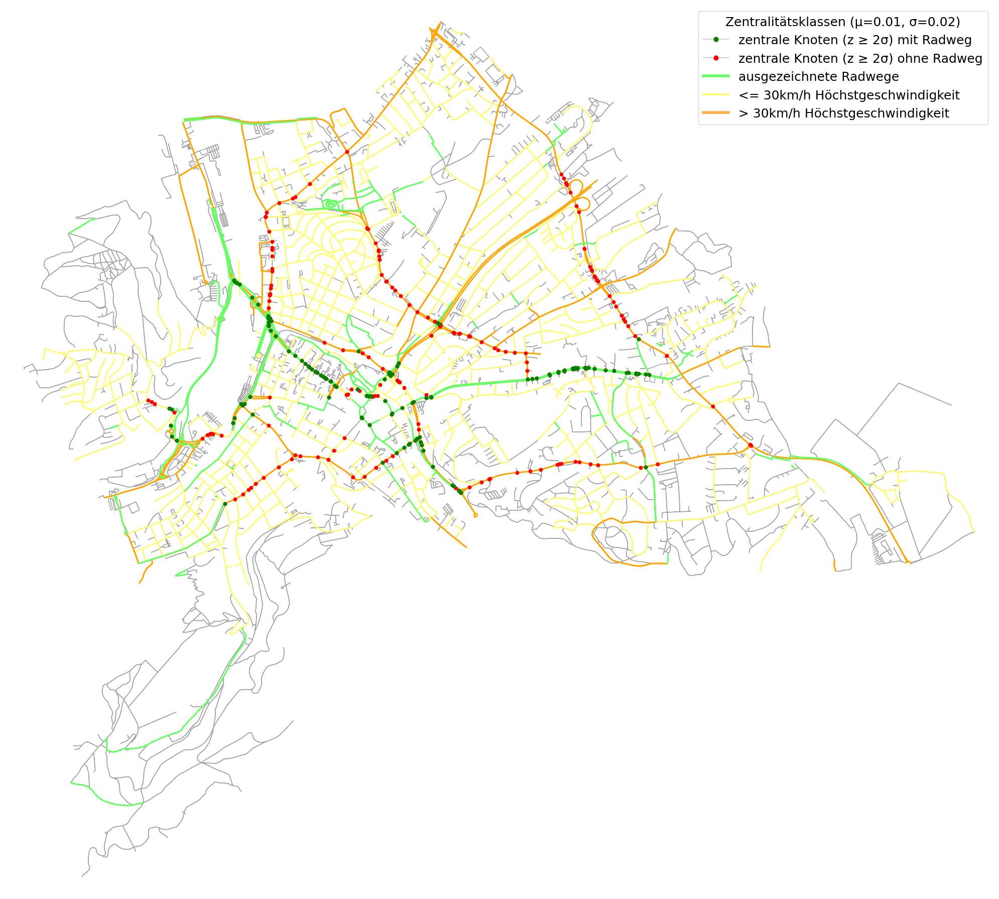

In [8]:
import re

# 3. Datenvorbereitung für Kanten
bike_edges = ox.graph_to_gdfs(B, nodes=False)

# Extrahiere alle Kanten aus Graph B
nodes, all_edges = ox.graph_to_gdfs(B)

# Muster für die Filterung
pattern_maxspeed = re.compile(r"^(40|50|60|70|80)$")
pattern_highway = re.compile(r"trunk|trunk_link")

# Filtermaske: maxspeed in (40, 50, 60, 70, 80) ODER highway ist trunk/trunk_link
mask = all_edges["maxspeed"].astype(str).str.match(pattern_maxspeed) | all_edges["highway"].astype(str).str.contains(pattern_highway)

# Gefilterte "schnelle" Kanten
fast_edges_filtered = all_edges[mask]

# Extrahiere IDs der langsamen und Fahrrad-Kanten
slow_nodes, slow_edges = ox.graph_to_gdfs(G_slow)
cycleway_nodes, cycleway_edges = ox.graph_to_gdfs(Cycleway_combined_filtered)
slow_edge_ids = slow_edges.index
cycleway_edge_ids = cycleway_edges.index

# Zeichne das Netz
fig, ax = ox.plot_graph(B, node_color='none', show=False, close=False, figsize=(20,20), dpi=300)
fig.patch.set_facecolor('white')
ax.set_facecolor('white')

# Zeichne die Kanten nach Kategorie
remaining_slow_edges = slow_edges[ ~slow_edges.index.isin(cycleway_edge_ids)]
remaining_slow_edges.plot(ax=ax, color='#FFFB7D', linewidth=2, alpha=1, zorder=2)

remaining_fast_edges_filtered = fast_edges_filtered[ ~fast_edges_filtered.index.isin(cycleway_edge_ids)]
remaining_fast_edges_filtered.plot(ax=ax, color='orange', linewidth=2, alpha=1, zorder=3)

# Die restlichen Kanten (ohne slow, bike, fast)
remaining_edges = all_edges[
    ~all_edges.index.isin(slow_edge_ids)
    & ~all_edges.index.isin(cycleway_edge_ids)
    & ~all_edges.index.isin(fast_edges_filtered.index)
]
remaining_edges.plot(ax=ax, color='lightgrey', linewidth=0.5, alpha=0.1)

# Radwege-Kanten grün
cycleway_edges.plot(ax=ax, color='#66FF66', linewidth=2, alpha=1, zorder=3)


# zentrale Knoten zeichnen
sorted_betweenness = sorted(betweenness_bike_weighted.items(), key=lambda x: x[1], reverse=True)

# 1. Vorbereitung der Daten
betweenness_values = np.array([x[1] for x in sorted_betweenness])
mean = np.mean(betweenness_values)
std = np.std(betweenness_values)

# 2. Farbpaletten definieren
red_palette = ['#800000', '#D43A3A', '#F08080', '#FFC1C1']  # Rot-Abstufungen
blue_palette = ['#000080', '#3A3AD4', '#8080F0', '#C1C1FF']  # Blau-Abstufungen

# 3. Z-Score Berechnung und Farbzuordnung
nodes['betweenness'] = nodes.index.map(betweenness_bike_weighted.get)
nodes['z_score'] = (nodes['betweenness'] - mean) / std

# Klassengrenzen (in Standardabweichungen)
bins = [-np.inf, -3, -2, -1, 0, 1, 2, 3, np.inf]
color_mapping = {
    0: blue_palette[0],  # < -3σ
    1: blue_palette[1],  # -3σ bis -2σ
    2: blue_palette[2],  # -2σ bis -1σ
    3: blue_palette[3],  # -1σ bis 0σ
    4: red_palette[3],   # 0σ bis 1σ
    5: red_palette[2],   # 1σ bis 2σ
    6: red_palette[1],   # 2σ bis 3σ
    7: red_palette[0]    # > 3σ
}

# Kategorisierung der Knoten
nodes['color_class'] = pd.cut(nodes['z_score'], bins=bins, labels=False)
nodes['color'] = nodes['color_class'].map(color_mapping)


# Knoten plotten (nur die zwei höchsten Klassen in Rot)
for color_class, group in nodes.groupby('color_class'):
    if color_class >= 6:  # Nur z ≥ 2σ
        group.plot(
            ax=ax,
            color='red',
            markersize=22,
            alpha=1,
            zorder=5
        )

covered_nodes_gdf = nodes.loc[covered_osm_ids]
covered_nodes_gdf.plot(
            ax=ax,
            color='green',
            markersize=22,
            alpha=1,
            zorder=6
        )

        
# 5. Legende
legend_elements = [
    Line2D([0], [0], marker='o', color='lightgrey', label='zentrale Knoten (z ≥ 2σ) mit Radweg',
           markerfacecolor='green', markersize=8),
    Line2D([0], [0], marker='o', color='lightgrey', label='zentrale Knoten (z ≥ 2σ) ohne Radweg',
           markerfacecolor='red', markersize=8),
    Line2D([0], [0], color='#66FF66', lw=4, label='ausgezeichnete Radwege'),       # hellgrün
    Line2D([0], [0], color='#FFFB7D', lw=3, label='<= 30km/h Höchstgeschwindigkeit'), # hellgelb
    Line2D([0], [0], color='#FFB347', lw=4, label='> 30km/h Höchstgeschwindigkeit')
]

ax.legend(
    handles=legend_elements,
    title=f"Zentralitätsklassen (μ={mean:.2f}, σ={std:.2f})",
    loc='upper right',
    fontsize=18,
    title_fontsize=18
)

plt.tight_layout()
plt.savefig('Masterarbeit/Radnetz_Stresslevel_ZentraleKnoten_Abdeckung.png', 
           dpi=300, bbox_inches='tight')
plt.show()


#### Vorschlag für Radnetz

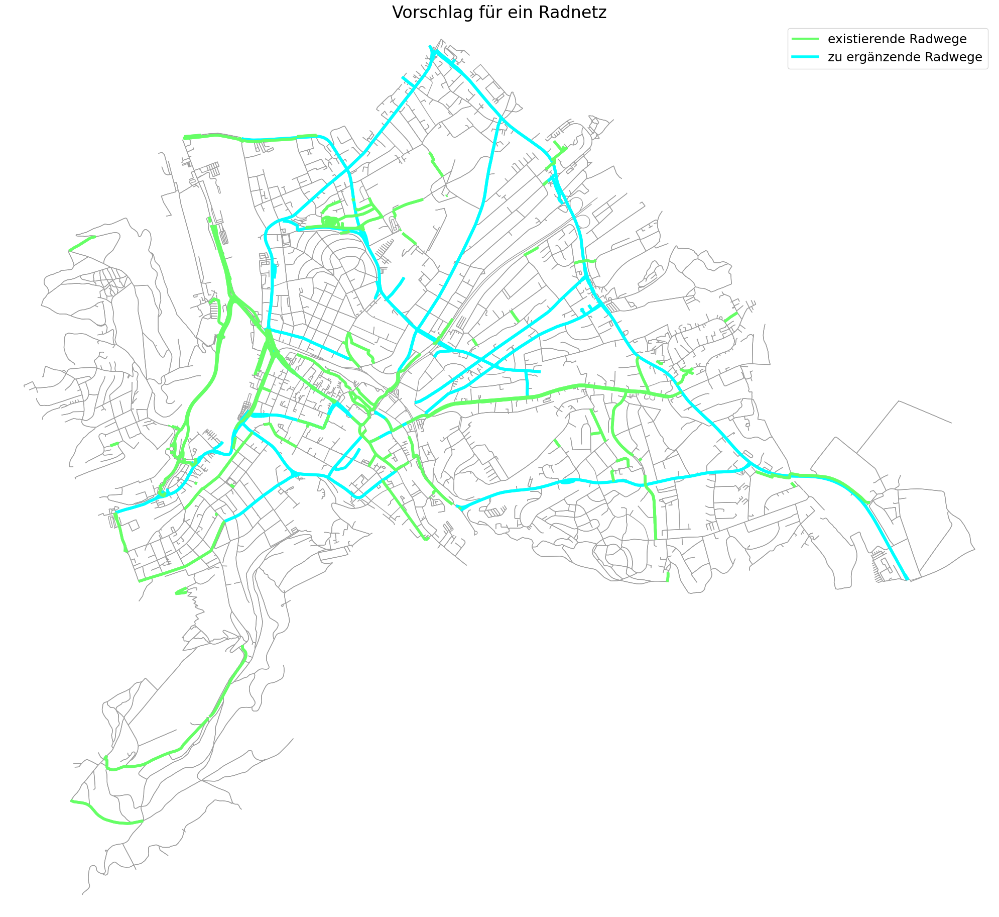

In [21]:
import re

B = ox.graph_from_place("Hagen Mitte, Germany", network_type="bike")

# 3. Datenvorbereitung für Kanten
bike_edges = ox.graph_to_gdfs(B, nodes=False)

# Extrahiere alle Kanten aus Graph B
all_nodes, all_edges = ox.graph_to_gdfs(B)

# Extrahiere IDs der langsamen und Fahrrad-Kanten
cycleway_nodes, cycleway_edges = ox.graph_to_gdfs(Cycleway_combined_filtered)
cycleway_edge_ids = cycleway_edges.index

# Zeichne das Netz
fig, ax = ox.plot_graph(B, node_color='none', show=False, close=False, figsize=(20,20), dpi=300)
fig.patch.set_facecolor('white')
ax.set_facecolor('white')

all_edges.plot(ax=ax, color='lightgrey', linewidth=0.5, alpha=0.1)

# Radwege-Kanten grün
cycleway_edges.plot(ax=ax, color='#66FF66', linewidth=4, alpha=1, zorder=6)

# 4.1 Spezifische Straßennamen einfärben
streets = {
    "Altenhagener Straße",
    "Boeler Straße",
    "Wasserloses Tal",
    "Karl-Ernst-Osthaus-Straße",
    "Am Sportpark",
    "Eduard-Müller-Straße",
    "Bülowstraße",
    "Brunnenstraße",
    "Wittekindstraße",
    "Feithstraße",
    "Buscheystraße",
    "Haldener Straße",
    "Wehringhauser Straße",
    "Haßleyer Straße",
    "Alexanderstraße",
    "Fleyer Straße",
    "Rathausstraße",
    "Lützowstraße",
    "Körnerstraße",
    "Karl-Marx-Straße",
    "Elberfelder Straße",
    "Kampstraße",
    "Goldbergstraße",
    "Holzmüllerstraße",
    "Bergischer Ring"
}


for street_name in streets:
    # Filterung mit Berücksichtigung von Listen in 'name'-Attributen
    mask = all_edges['name'].apply(
        lambda x: street_name in x if isinstance(x, list) else x == street_name
    )
    all_edges[mask].plot(
        ax=ax,
        color='cyan',
        linewidth=4.2,
        alpha=1,
        zorder=4,
        label=street_name
    )

# Legende
from matplotlib.lines import Line2D
legend_elements = [
Line2D([0], [0], color='#66FF66', lw=3, label='existierende Radwege'),
Line2D([0], [0], color='cyan', lw=4, label='zu ergänzende Radwege')       # hellgrün
]


ax.legend(
    handles=legend_elements,
    title=f"",
    loc='upper right',
    fontsize=18,
    title_fontsize=18
)

ax.set_title("Vorschlag für ein Radnetz", fontsize=24)

plt.tight_layout()
plt.savefig('Masterarbeit/Mein_Radnetz.png', dpi=300, bbox_inches='tight')
plt.show()


#### Straßennamen der zentralen Kanten

In [12]:
# Graph laden
B = ox.graph_from_place("Hagen Mitte, Germany", network_type="bike")
nodes, edges = ox.graph_to_gdfs(B)

# edge_betweenness_bike_weighted = nx.edge_betweenness_centrality(B, weight='length', normalized=True)

# 1. Datenvorbereitung
edges['betweenness'] = edges.index.map(edge_betweenness_bike_weighted.get)
betweenness_values = edges['betweenness'].dropna().values

mean = np.mean(betweenness_values)
std = np.std(betweenness_values)

# 3. Z-Score Berechnung und Klassifizierung
edges['z_score'] = (edges['betweenness'] - mean) / std

# Zentrale Kanten filtern (z.B. z_score >= 2)
central_edges = edges[edges['z_score'] >= 2]

count_central_edges = len(central_edges)
print("Anzahl zentraler Kanten:", count_central_edges)

# Gesamtanzahl aller Kanten
total_edges = len(B.edges())

# Prozentberechnung
percentage_central = (count_central_edges / total_edges) * 100

print(f"Zentrale Kanten: {percentage_central:.2f}% des gesamten Netzwerks")


Anzahl zentraler Kanten: 604
Zentrale Kanten: 6.07% des gesamten Netzwerks


In [13]:
# Filterung nach bicycle und cycleway ohne Eintrag oder 'no'
mask = (
    (central_edges['bicycle'].isna() | (central_edges['bicycle'] == 'no')) &
    (central_edges['cycleway'].isna() | (central_edges['cycleway'] == 'no')) &
    (central_edges['cycleway:left'].isna() | (central_edges['cycleway:left'] == 'no')) &
    (central_edges['cycleway:right'].isna() | (central_edges['cycleway:right'] == 'no')) &
    (central_edges['cycleway:both'].isna() | (central_edges['cycleway:both'] == 'no')) &
    (central_edges['bicycle_road'].isna() | (central_edges['bicycle_road'] == 'no'))
)
filtered_edges = central_edges[mask]

# Anzahlberechnung
remaining_count = len(filtered_edges)
original_count = len(central_edges)
filtered_out_count = original_count - remaining_count

print(f"Verbleibende Kanten: {remaining_count}")
print(f"Herausgefilterte Kanten: {filtered_out_count}")

# Prozentberechnung
percentage = (filtered_out_count / count_central_edges) * 100

print(f"ausgezeichnete Radwege auf {percentage:.2f}% der zentralen Kanten")


Verbleibende Kanten: 439
Herausgefilterte Kanten: 165
ausgezeichnete Radwege auf 27.32% der zentralen Kanten


In [10]:
# Häufigkeiten der Werte in der Spalte 'maxspeed' zählen (inklusive NaN)
maxspeed_counts = filtered_edges['maxspeed'].value_counts(dropna=False)
print(maxspeed_counts)

50          366
30           71
[30, 50]      2
Name: maxspeed, dtype: int64


In [14]:
central_names_filtered = filtered_edges['name'].dropna()

# Flache Liste aller Namen
central_names_filtered_list = list(chain.from_iterable(
    n if isinstance(n, list) else [n] for n in central_names_filtered
))
central_names_filtered_set = set(central_names_filtered_list)
print("\nEindeutige Namen der zentralen Kanten:")
print(central_names_filtered_set)


Eindeutige Namen der zentralen Kanten:
{'Volmestraße', 'Boeler Straße', 'Wasserloses Tal', 'Zehlendorfer Straße', 'Eickertstraße', 'Am Sportpark', 'Karl-Marx-Straße', 'Märkischer Ring', 'Emilienplatz', 'Brunnenstraße', 'Altenhagener Straße', 'Kuhlestraße', 'Fleyer Straße', 'Haldener Straße', 'Sparkassen-Karree', 'Eduard-Müller-Straße', 'Elberfelder Straße', 'Holzmüllerstraße', 'Eckeseyer Straße', 'Alexanderstraße', 'Haßleyer Straße', 'Goldbergstraße', 'Heinitzstraße', 'Wehringhauser Straße', 'Bülowstraße', 'Yorckstraße', 'Feithstraße', 'Badstraße', 'Buscheystraße', 'Karl-Ernst-Osthaus-Straße', 'Körnerstraße', 'Bergischer Ring'}


In [14]:
# Zentrale Kanten filtern (z.B. z_score >= 2)
central_edges = edges[edges['z_score'] >= 2]
central_names = central_edges['name'].dropna()

# Flache Liste aller Namen
central_names_list = list(chain.from_iterable(
    n if isinstance(n, list) else [n] for n in central_names
))
central_names_set = set(central_names_list)
print("\nEindeutige Namen der zentralen Kanten:")
print(central_names_set)



Eindeutige Namen der zentralen Kanten:
{'Kampstraße', 'Heinitzstraße', 'Fleyer Straße', 'Am Sportpark', 'Karl-Marx-Straße', 'Badstraße', 'Kuhlestraße', 'Eickertstraße', 'Sparkassen-Karree', 'Brunnenstraße', 'Graf-von-Galen-Ring', 'Boeler Straße', 'Karl-Ernst-Osthaus-Straße', 'Goldbergstraße', 'Rathausstraße', 'Friedrich-Ebert-Platz', 'Eckeseyer Straße', 'Rembergstraße', 'Wehringhauser Straße', 'Feithstraße', 'Emilienplatz', 'Weißdornweg', 'Altenhagener Brücke', 'Potthofstraße', 'Körnerstraße', 'Yorckstraße', 'Bergischer Ring', 'Haldener Straße', 'Altenhagener Straße', 'Märkischer Ring', 'Buscheystraße', 'Alexanderstraße', 'Augustastraße', 'Wasserloses Tal', 'Holzmüllerstraße', 'Haßleyer Straße', 'Elberfelder Straße', 'Bülowstraße', 'Zehlendorfer Straße', 'Eppenhauser Straße', 'Volmestraße', 'Eduard-Müller-Straße'}


In [49]:
# GeoDataFrames aus Cycleway_combined
bike_nodes_c, bike_edges_c = ox.graph_to_gdfs(Cycleway_combined)

# Alle Namen aus diesen Kanten extrahieren
cycleway_names = bike_edges_c['name'].dropna()
cycleway_names_list = list(chain.from_iterable(
    n if isinstance(n, list) else [n] for n in cycleway_names
))
cycleway_names_set = set(cycleway_names_list)

# Namen, die in beiden vorkommen
names_in_both = central_names_set & cycleway_names_set

# Namen, die nur bei den zentralen Kanten vorkommen, aber nicht in Cycleway_combined
names_only_in_central = central_names_set - cycleway_names_set

# Namen, die nur in Cycleway_combined vorkommen, aber nicht bei den zentralen Kanten
names_only_in_cycleway = cycleway_names_set - central_names_set

# Ausgabe
print("Namen in beiden Datensätzen:")
for name in sorted(names_in_both):
    print(name)

print("\nNamen nur bei den zentralen Kanten (nicht in Cycleway_combined):")
for name in sorted(names_only_in_central):
    print(name)

print("\nNamen nur in Cycleway_combined (nicht bei den zentralen Kanten):")
for name in sorted(names_only_in_cycleway):
    print(name)


Namen in beiden Datensätzen:
Altenhagener Brücke
Altenhagener Straße
Augustastraße
Badstraße
Bergischer Ring
Bülowstraße
Eckeseyer Straße
Elberfelder Straße
Emilienplatz
Eppenhauser Straße
Fleyer Straße
Friedrich-Ebert-Platz
Graf-von-Galen-Ring
Holzmüllerstraße
Kampstraße
Karl-Marx-Straße
Körnerstraße
Märkischer Ring
Potthofstraße
Rathausstraße
Rembergstraße
Sparkassen-Karree
Wehringhauser Straße
Weißdornweg
Yorckstraße

Namen nur bei den zentralen Kanten (nicht in Cycleway_combined):
Alexanderstraße
Am Sportpark
Boeler Straße
Brunnenstraße
Buscheystraße
Eduard-Müller-Straße
Eickertstraße
Feithstraße
Goldbergstraße
Haldener Straße
Haßleyer Straße
Heinitzstraße
Karl-Ernst-Osthaus-Straße
Kuhlestraße
Volmestraße
Wasserloses Tal
Zehlendorfer Straße

Namen nur in Cycleway_combined (nicht bei den zentralen Kanten):
Am Hauptbahnhof
Am Hohen Graben
Am Teich
Am Widey
Auf der Breite
Bahnhofstraße
Bergstraße
Berliner Platz
Bürgerstraße
Dahlenkampstraße
Deerthstraße
Donnerkuhler Weg
Dömbergstraße


#### Drive weighted length

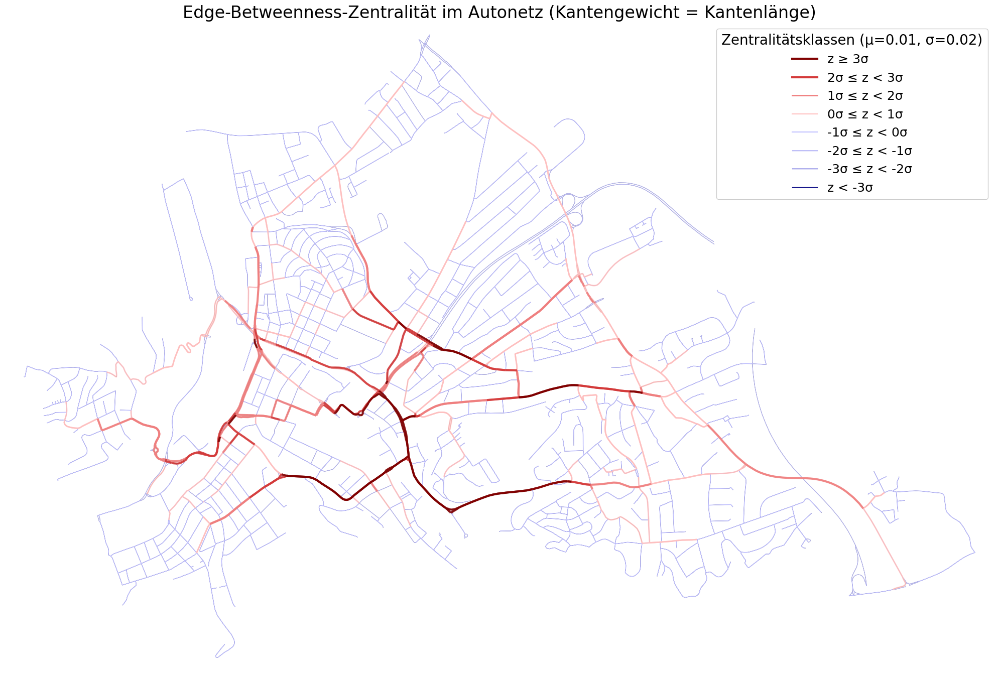

In [18]:
# Graph laden und Betweenness berechnen
G = ox.graph_from_place("Hagen Mitte, Germany", network_type="drive")
nodes, edges = ox.graph_to_gdfs(G)

# 1. Datenvorbereitung
edges['betweenness'] = edges.index.map(edge_betweenness_weighted.get)
betweenness_values = edges['betweenness'].dropna().values

mean = np.mean(betweenness_values)
std = np.std(betweenness_values)

# 2. Farbpaletten (identisch zur Node-Version)
red_palette = ['#800000', '#D43A3A', '#F08080', '#FFC1C1']  # Rot-Abstufungen (hohe Zentralität)
blue_palette = ['#000080', '#3A3AD4', '#8080F0', '#C1C1FF']  # Blau-Abstufungen (niedrige Zentralität)

# 3. Z-Score Berechnung und Klassifizierung
edges['z_score'] = (edges['betweenness'] - mean) / std
bins = [-np.inf, -3, -2, -1, 0, 1, 2, 3, np.inf]
color_mapping = {
    0: blue_palette[0],  # < -3σ
    1: blue_palette[1],  # -3σ bis -2σ
    2: blue_palette[2],  # -2σ bis -1σ
    3: blue_palette[3],  # -1σ bis 0σ
    4: red_palette[3],   # 0σ bis 1σ
    5: red_palette[2],   # 1σ bis 2σ
    6: red_palette[1],   # 2σ bis 3σ
    7: red_palette[0]    # > 3σ
}
edges['color_class'] = pd.cut(edges['z_score'], bins=bins, labels=False)
edges['color'] = edges['color_class'].map(color_mapping)

# 4. Visualisierung
fig, ax = ox.plot_graph(
    G, 
    show=False, 
    close=False,
    figsize=(20, 20),
    dpi=300,
    node_size=0,  # Knoten ausblenden
    edge_color='black',  # Hintergrund für nicht klassifizierte Kanten
    edge_linewidth=0.5,
    bgcolor='white'
)
            
for color_class, group in edges.groupby('color_class'):
    group.plot(
        ax=ax,
        color=color_mapping[color_class],
        linewidth=3 if color_class >= 5 else (2 if color_class >= 4 else 1),
        alpha=0.9,
        zorder=2
    )

# 5. Legende
legend_elements = [
    Line2D([0], [0], color=red_palette[0], lw=3, label='z ≥ 3σ'),
    Line2D([0], [0], color=red_palette[1], lw=3, label='2σ ≤ z < 3σ'),
    Line2D([0], [0], color=red_palette[2], lw=2, label='1σ ≤ z < 2σ'),
    Line2D([0], [0], color=red_palette[3], lw=1.5, label='0σ ≤ z < 1σ'),
    Line2D([0], [0], color=blue_palette[3], lw=1.5, label='-1σ ≤ z < 0σ'),
    Line2D([0], [0], color=blue_palette[2], lw=1, label='-2σ ≤ z < -1σ'),
    Line2D([0], [0], color=blue_palette[1], lw=1, label='-3σ ≤ z < -2σ'),
    Line2D([0], [0], color=blue_palette[0], lw=1, label='z < -3σ')
]

ax.legend(
    handles=legend_elements,
    title=f"Zentralitätsklassen (μ={mean:.2f}, σ={std:.2f})",
    loc='upper right',
    fontsize=18,
    title_fontsize=20,
    framealpha=1
)

plt.title("Edge-Betweenness-Zentralität im Autonetz (Kantengewicht = Kantenlänge)", fontsize=24)
plt.tight_layout()
plt.savefig('Masterarbeit/edge_betweenness_weighted_drive.png', dpi=300, bbox_inches='tight')
plt.show()


#### Drive weighted travel_time

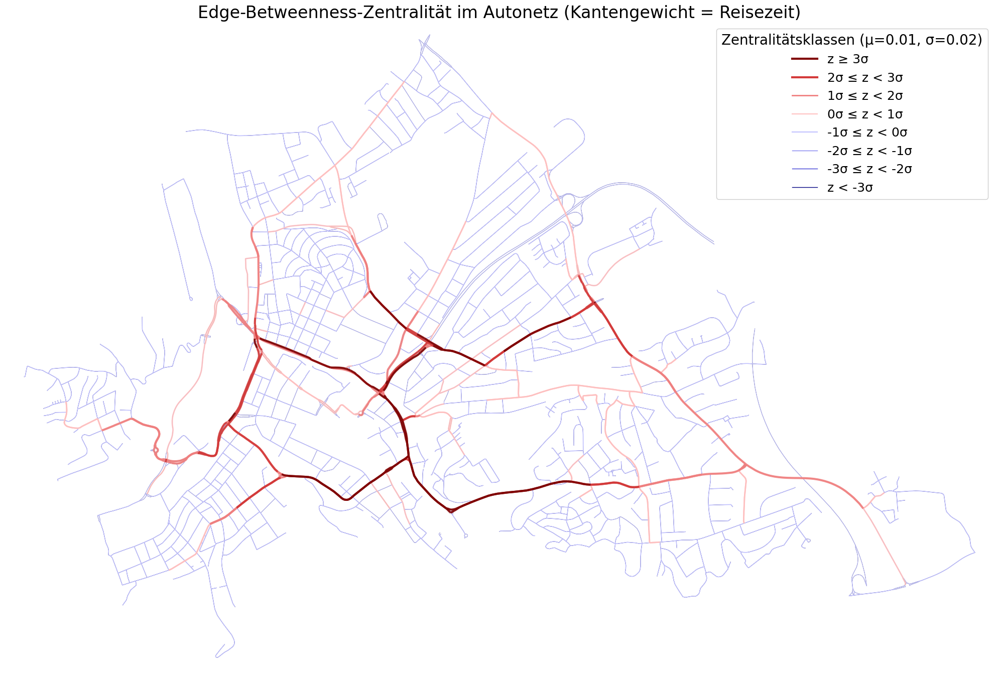

In [20]:
# Graph laden und Betweenness berechnen
G = ox.graph_from_place("Hagen Mitte, Germany", network_type="drive")
nodes, edges = ox.graph_to_gdfs(G)

# 1. Datenvorbereitung
edges['betweenness'] = edges.index.map(edge_betweenness_weighted_traveltime.get)
betweenness_values = edges['betweenness'].dropna().values

mean = np.mean(betweenness_values)
std = np.std(betweenness_values)

# 2. Farbpaletten (identisch zur Node-Version)
red_palette = ['#800000', '#D43A3A', '#F08080', '#FFC1C1']  # Rot-Abstufungen (hohe Zentralität)
blue_palette = ['#000080', '#3A3AD4', '#8080F0', '#C1C1FF']  # Blau-Abstufungen (niedrige Zentralität)

# 3. Z-Score Berechnung und Klassifizierung
edges['z_score'] = (edges['betweenness'] - mean) / std
bins = [-np.inf, -3, -2, -1, 0, 1, 2, 3, np.inf]
color_mapping = {
    0: blue_palette[0],  # < -3σ
    1: blue_palette[1],  # -3σ bis -2σ
    2: blue_palette[2],  # -2σ bis -1σ
    3: blue_palette[3],  # -1σ bis 0σ
    4: red_palette[3],   # 0σ bis 1σ
    5: red_palette[2],   # 1σ bis 2σ
    6: red_palette[1],   # 2σ bis 3σ
    7: red_palette[0]    # > 3σ
}
edges['color_class'] = pd.cut(edges['z_score'], bins=bins, labels=False)
edges['color'] = edges['color_class'].map(color_mapping)

# 4. Visualisierung
fig, ax = ox.plot_graph(
    G, 
    show=False, 
    close=False,
    figsize=(20, 20),
    dpi=300,
    node_size=0,  # Knoten ausblenden
    edge_color='black',  # Hintergrund für nicht klassifizierte Kanten
    edge_linewidth=0.5,
    bgcolor='white'
)
            
for color_class, group in edges.groupby('color_class'):
    group.plot(
        ax=ax,
        color=color_mapping[color_class],
        linewidth=3 if color_class >= 5 else (2 if color_class >= 4 else 1),
        alpha=0.9,
        zorder=2
    )

# 5. Legende
legend_elements = [
    Line2D([0], [0], color=red_palette[0], lw=3, label='z ≥ 3σ'),
    Line2D([0], [0], color=red_palette[1], lw=3, label='2σ ≤ z < 3σ'),
    Line2D([0], [0], color=red_palette[2], lw=2, label='1σ ≤ z < 2σ'),
    Line2D([0], [0], color=red_palette[3], lw=1.5, label='0σ ≤ z < 1σ'),
    Line2D([0], [0], color=blue_palette[3], lw=1.5, label='-1σ ≤ z < 0σ'),
    Line2D([0], [0], color=blue_palette[2], lw=1, label='-2σ ≤ z < -1σ'),
    Line2D([0], [0], color=blue_palette[1], lw=1, label='-3σ ≤ z < -2σ'),
    Line2D([0], [0], color=blue_palette[0], lw=1, label='z < -3σ')
]

ax.legend(
    handles=legend_elements,
    title=f"Zentralitätsklassen (μ={mean:.2f}, σ={std:.2f})",
    loc='upper right',
    fontsize=18,
    title_fontsize=20,
    framealpha=1
)

plt.title("Edge-Betweenness-Zentralität im Autonetz (Kantengewicht = Reisezeit)", fontsize=24)
plt.tight_layout()
plt.savefig('Masterarbeit/edge_betweenness_weighted_drive_traveltime.png', dpi=300, bbox_inches='tight')
plt.show()


#### Vergleich Bike und Drive

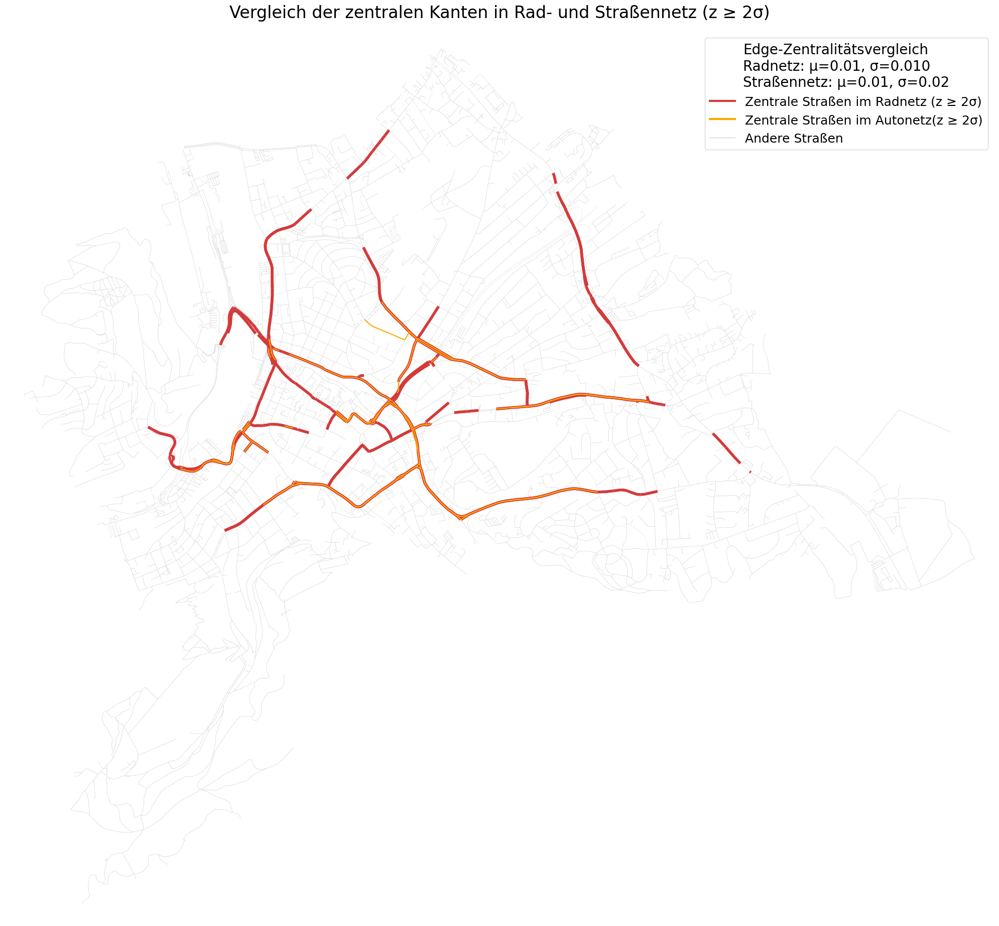

In [33]:
# 1. Beide Netzwerke laden
B = ox.graph_from_place("Hagen Mitte, Germany", network_type="bike")
G = ox.graph_from_place("Hagen Mitte, Germany", network_type="drive")

# 3. Datenvorbereitung für Kanten
bike_edges = ox.graph_to_gdfs(B, nodes=False)
drive_edges = ox.graph_to_gdfs(G, nodes=False)

# Z-Scores für Radnetz-Kanten berechnen
bike_edge_values = np.array(list(edge_betweenness_bike_weighted.values()))
bike_edge_mean = np.mean(bike_edge_values)
bike_edge_std = np.std(bike_edge_values)
bike_edges['z_score'] = (bike_edges.index.map(edge_betweenness_bike_weighted.get) - bike_edge_mean) / bike_edge_std

# Z-Scores für Straßennetz-Kanten berechnen
drive_edge_values = np.array(list(edge_betweenness_weighted.values()))
drive_edge_mean = np.mean(drive_edge_values)
drive_edge_std = np.std(drive_edge_values)
drive_edges['z_score'] = (drive_edges.index.map(edge_betweenness_weighted.get) - drive_edge_mean) / drive_edge_std

# 4. Visualisierung vorbereiten
fig, ax = ox.plot_graph(B, 
                       show=False, 
                       close=False,
                       figsize=(20, 20),
                       dpi=300,
                       bgcolor='white',
                       node_size=0,
                       edge_color='lightgray',
                       edge_linewidth=0.3)

# 5. Straßennetz-Kanten plotten (z ≥ 2σ)
for z_class, group in drive_edges.groupby(pd.cut(drive_edges['z_score'], 
                                               [-np.inf, 2, np.inf])):
    if z_class.right > 2:
        color = '#FFA700'  # Orange
        lw = 1.5
        group.plot(ax=ax, color=color, linewidth=lw, zorder=3)

# 6. Radnetz-Kanten plotten (z ≥ 2σ)
for z_class, group in bike_edges.groupby(pd.cut(bike_edges['z_score'], 
                                              [-np.inf, 2, np.inf])):
    if z_class.right > 2:
        color = '#D43A3A'  # Rot
        lw = 4
        group.plot(ax=ax, color=color, linewidth=lw, zorder=2)

# 7. Legende und Titel
legend_elements = [
    Line2D([0], [0], color='#D43A3A', lw=3, label='Zentrale Straßen im Radnetz (z ≥ 2σ)'),
    Line2D([0], [0], color='#FFA700', lw=3, label='Zentrale Straßen im Autonetz(z ≥ 2σ)'),
    Line2D([0], [0], color='lightgray', lw=1, label='Andere Straßen')
]

ax.legend(handles=legend_elements,
         loc='upper right',
         title=f"Edge-Zentralitätsvergleich\nRadnetz: μ={bike_edge_mean:.2f}, σ={bike_edge_std:.3f}\nStraßennetz: μ={drive_edge_mean:.2f}, σ={drive_edge_std:.2f}",
         fontsize=18,
         title_fontsize=20)

ax.set_title("Vergleich der zentralen Kanten in Rad- und Straßennetz (z ≥ 2σ)", 
            fontsize=24, pad=20)
plt.tight_layout()
plt.savefig('Masterarbeit/combined_edge_betweeness.png', dpi=300, bbox_inches='tight')
plt.show()


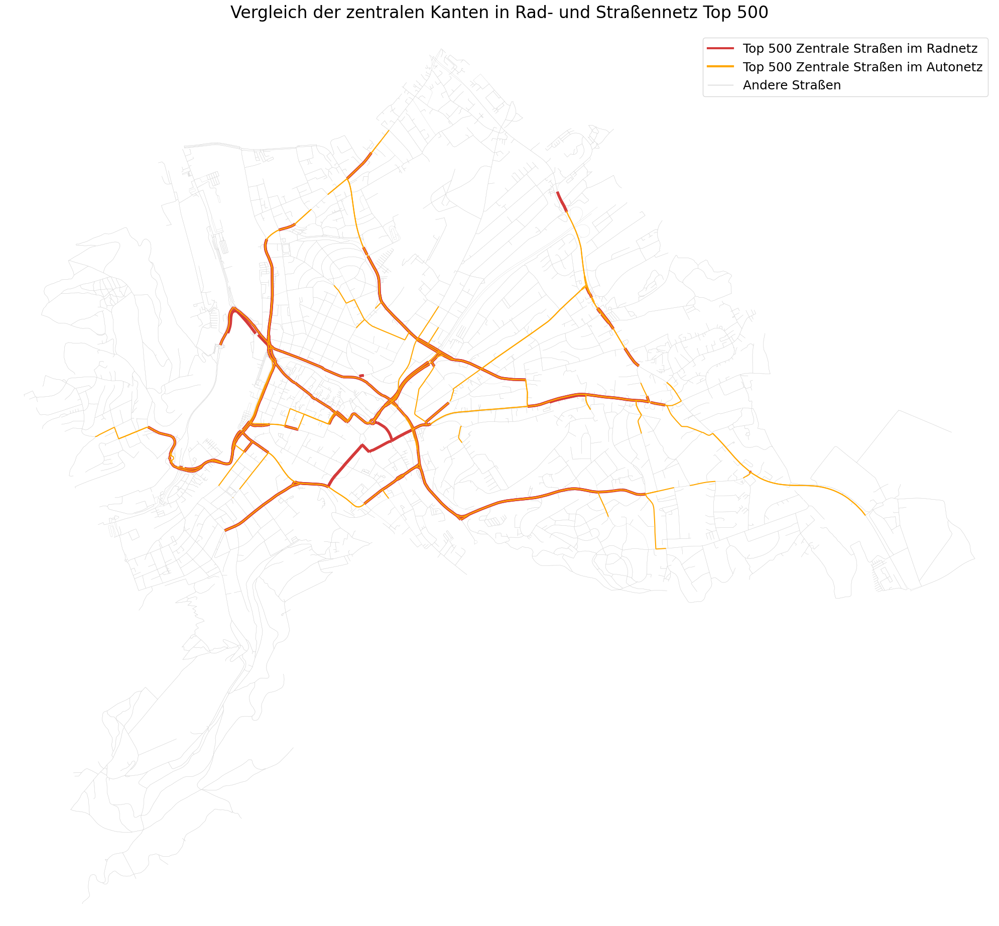

In [20]:
# 1. Beide Netzwerke laden
B = ox.graph_from_place("Hagen Mitte, Germany", network_type="bike")
G = ox.graph_from_place("Hagen Mitte, Germany", network_type="drive")

# 3. Datenvorbereitung für Kanten
bike_edges = ox.graph_to_gdfs(B, nodes=False)
drive_edges = ox.graph_to_gdfs(G, nodes=False)

# Annahme: edge_betweenness_bike_weighted und edge_betweenness_weighted sind dicts: (u, v, key) -> Wert

# Sortiere die Kanten nach Betweenness
sorted_bike_betweenness = sorted(edge_betweenness_bike_weighted.items(), key=lambda x: x[1], reverse=True)
sorted_drive_betweenness = sorted(edge_betweenness_weighted.items(), key=lambda x: x[1], reverse=True)

top_n = 500

# Extrahiere die Top-N Kanten-IDs
top_bike_edge_ids = [edge[0] for edge in sorted_bike_betweenness[:top_n]]
top_drive_edge_ids = [edge[0] for edge in sorted_drive_betweenness[:top_n]]

# Filtere die GeoDataFrames für die Top-N Kanten
top_bike_edges_gdf = bike_edges.loc[top_bike_edge_ids]
top_drive_edges_gdf = drive_edges.loc[top_drive_edge_ids]

# 4. Visualisierung vorbereiten
fig, ax = ox.plot_graph(B, 
                       show=False, 
                       close=False,
                       figsize=(20, 20),
                       dpi=300,
                       bgcolor='white',
                       node_size=0,
                       edge_color='lightgray',
                       edge_linewidth=0.3)

# Top-Kanten plotten
top_bike_edges_gdf.plot(ax=ax, color='#D43A3A', linewidth=4, alpha=1, zorder=2)
top_drive_edges_gdf.plot(ax=ax, color='#FFA700', linewidth=1.5, alpha=1, zorder=3)

# 7. Legende und Titel
legend_elements = [
    Line2D([0], [0], color='#D43A3A', lw=3, label='Top 500 Zentrale Straßen im Radnetz'),
    Line2D([0], [0], color='#FFA700', lw=3, label='Top 500 Zentrale Straßen im Autonetz'),
    Line2D([0], [0], color='lightgray', lw=1, label='Andere Straßen')
]

ax.legend(handles=legend_elements,
         loc='upper right',
         fontsize=18,
         title_fontsize=20)

ax.set_title("Vergleich der zentralen Kanten in Rad- und Straßennetz Top 500", 
            fontsize=24, pad=20)
plt.tight_layout()
plt.savefig('Masterarbeit/combined_edge_centrality_500.png', dpi=300, bbox_inches='tight')
plt.show()


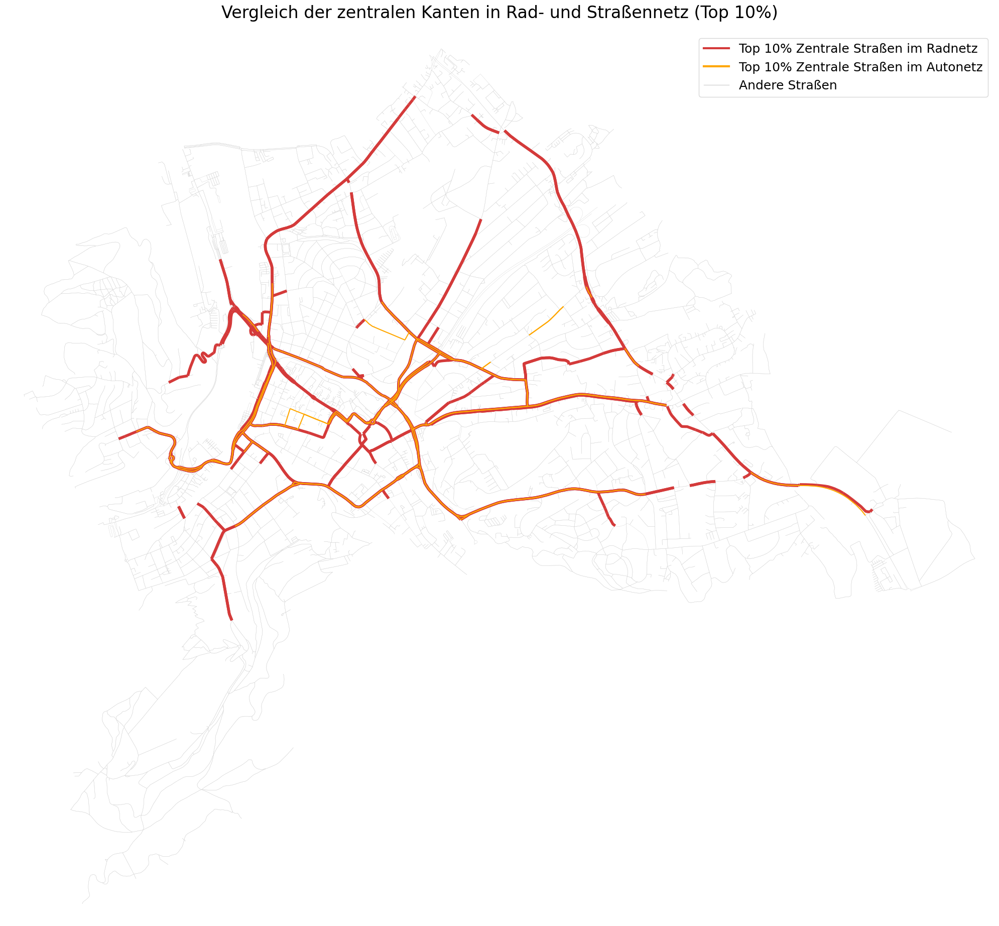

In [27]:
# 1. Beide Netzwerke laden
B = ox.graph_from_place("Hagen Mitte, Germany", network_type="bike")
G = ox.graph_from_place("Hagen Mitte, Germany", network_type="drive")

# 3. Datenvorbereitung für Kanten
bike_edges = ox.graph_to_gdfs(B, nodes=False)
drive_edges = ox.graph_to_gdfs(G, nodes=False)

# Annahme: edge_betweenness_bike_weighted und edge_betweenness_weighted sind dicts: (u, v, key) -> Wert

# Sortiere die Kanten nach Betweenness
sorted_bike_betweenness = sorted(edge_betweenness_bike_weighted.items(), key=lambda x: x[1], reverse=True)
sorted_drive_betweenness = sorted(edge_betweenness_weighted.items(), key=lambda x: x[1], reverse=True)

# Anzahl der Top 10% Kanten berechnen
top_percent = 0.10
top_n_bike = int(len(bike_edges) * top_percent)
top_n_drive = int(len(drive_edges) * top_percent)

# Extrahiere die Top-X Kanten-IDs
top_bike_edge_ids = [edge[0] for edge in sorted_bike_betweenness[:top_n_bike]]
top_drive_edge_ids = [edge[0] for edge in sorted_drive_betweenness[:top_n_drive]]

# Filtere die GeoDataFrames für die Top-X Kanten
top_bike_edges_gdf = bike_edges.loc[top_bike_edge_ids]
top_drive_edges_gdf = drive_edges.loc[top_drive_edge_ids]

# 4. Visualisierung vorbereiten
fig, ax = ox.plot_graph(B, 
                       show=False, 
                       close=False,
                       figsize=(20, 20),
                       dpi=300,
                       bgcolor='white',
                       node_size=0,
                       edge_color='lightgray',
                       edge_linewidth=0.3)

# Top-Kanten plotten
top_bike_edges_gdf.plot(ax=ax, color='#D43A3A', linewidth=4, alpha=1, zorder=2)
top_drive_edges_gdf.plot(ax=ax, color='#FFA700', linewidth=1.5, alpha=1, zorder=3)

# 7. Legende und Titel
legend_elements = [
    Line2D([0], [0], color='#D43A3A', lw=3, label='Top 10% Zentrale Straßen im Radnetz'),
    Line2D([0], [0], color='#FFA700', lw=3, label='Top 10% Zentrale Straßen im Autonetz'),
    Line2D([0], [0], color='lightgray', lw=1, label='Andere Straßen')
]

ax.legend(handles=legend_elements,
         loc='upper right',
         fontsize=18,
         title_fontsize=20)

ax.set_title("Vergleich der zentralen Kanten in Rad- und Straßennetz (Top 10%)", 
            fontsize=24, pad=20)
plt.tight_layout()
plt.savefig('Masterarbeit/combined_edge_centrality_top10percent.png', dpi=300, bbox_inches='tight')
plt.show()


In [ ]:
# Graph laden und Betweenness berechnen
B = ox.graph_from_place("Hagen Mitte, Germany", network_type="bike")
nodes, edges = ox.graph_to_gdfs(B)

# 1. Datenvorbereitung
edges['betweenness'] = edges.index.map(edge_betweenness_bike_weighted.get)
betweenness_values = edges['betweenness'].dropna().values

mean = np.mean(betweenness_values)
std = np.std(betweenness_values)

# 2. Farbpaletten (identisch zur Node-Version)
red_palette = ['#800000', '#D43A3A', '#F08080', '#FFC1C1']  # Rot-Abstufungen (hohe Zentralität)
blue_palette = ['#000080', '#3A3AD4', '#8080F0', '#C1C1FF']  # Blau-Abstufungen (niedrige Zentralität)

# 3. Z-Score Berechnung und Klassifizierung
edges['z_score'] = (edges['betweenness'] - mean) / std
bins = [-np.inf, -3, -2, -1, 0, 1, 2, 3, np.inf]
color_mapping = {
    0: blue_palette[0],  # < -3σ
    1: blue_palette[1],  # -3σ bis -2σ
    2: blue_palette[2],  # -2σ bis -1σ
    3: blue_palette[3],  # -1σ bis 0σ
    4: red_palette[3],   # 0σ bis 1σ
    5: red_palette[2],   # 1σ bis 2σ
    6: red_palette[1],   # 2σ bis 3σ
    7: red_palette[0]    # > 3σ
}
edges['color_class'] = pd.cut(edges['z_score'], bins=bins, labels=False)
edges['color'] = edges['color_class'].map(color_mapping)

# 4. Visualisierung
fig, ax = ox.plot_graph(
    B, 
    show=False, 
    close=False,
    figsize=(20, 20),
    dpi=300,
    node_size=0,  # Knoten ausblenden
    edge_color='black',  # Hintergrund für nicht klassifizierte Kanten
    edge_linewidth=0.5,
    bgcolor='white'
)
            
for color_class, group in edges.groupby('color_class'):
    group.plot(
        ax=ax,
        color=color_mapping[color_class],
        linewidth=2 if color_class >= 4 else 1,
        alpha=1,
        zorder=2
    )
    
G = ox.graph_from_place("Hagen Mitte, Germany", network_type="drive")
nodes_drive, edges_drive = ox.graph_to_gdfs(G)

sorted_betweenness_drive = sorted(betweenness_weighted.items(), key=lambda x: x[1], reverse=True)

# 1. Vorbereitung der Daten
betweenness_values_drive = np.array([x[1] for x in sorted_betweenness_drive])
mean_drive = np.mean(betweenness_values_drive)
std_drive = np.std(betweenness_values_drive)

# 3. Z-Score Berechnung und Farbzuordnung
nodes_drive['betweenness'] = nodes_drive.index.map(betweenness_weighted.get)
nodes_drive['z_score'] = (nodes_drive['betweenness'] - mean_drive) / std_drive

# Kategorisierung der Knoten
nodes_drive['color_class'] = pd.cut(nodes_drive['z_score'], bins=bins, labels=False)
nodes_drive['color'] = nodes_drive['color_class'].map(color_mapping)

# Knoten plotten - WICHTIG: Hier verwenden wir die konkreten Farbwerte
for color_class, group in nodes_drive.groupby('color_class'):
    group.plot(
        ax=ax, 
        color=color_mapping[color_class],  # Konkrete Farbangabe
        markersize=40 if color_class >= 4 else 30,  # Größere Marker für große Werte
        alpha=1,
        zorder=3
    )


plt.tight_layout()
plt.savefig('Masterarbeit/edge_betweenness_weighted_combined.png', dpi=300, bbox_inches='tight')
plt.show()